# The Variational Autoencoder

## 1. Introduction

Written by Albert Hao Li (2020).

Lightly edited by Sabera Talukder (2022).

Reusing and repurposing, with permission, for the Chen Institute Data Science and Artificial Intelligence Neuroscience Summer School.

### 1.1 Overview

This notebook is a code tutorial on the variational autoencoder (VAE). There are four examples. First, we learn a data distribution over a simple bivariate Gaussian distribution. Second, we learn a data distribution over two separate bivariate Gaussians. Third, we learn to reconstruct data from the MNIST dataset. Fourth, we learn to reconstruct the MNIST dataset again but using the labels as conditioning variables. Along the way, I hope to highlight some relevant implementation details.

You should be running this notebook with a Python 3 kernel. You also need to make sure that whatever environment you're using has installed the dependencies in the imports section (`numpy`, `torch`, `torchvision`, etc.). There is no GPU support for this code, since it should comfortably run on your personal CPU, but note that any serious attempt at modeling large models using high-dimensional data will need to contend with device management.

If you aren't familiar with PyTorch, I would encourage you to quickly go through the tutorial on their website: https://pytorch.org/tutorials/.

### 1.2 References

[1] D. P. Kingma and M. Welling, “Auto-encoding variational bayes,” *2nd International Conference on Learning Representations, ICLR 2014*, 2014.

[2] K. Sohn, H. Lee, and X. Yan, “Learning structured output representation using deep conditional generative models,” in *Advances in Neural Information Processing Systems 28*, C. Cortes, N. D. Lawrence, D. D. Lee, M. Sugiyama, and R. Garnett, Eds., Curran Associates, Inc., 2015, pp. 3483–3491.

## 2. Main Implementation

### 2.1 Imports and Utilities

This first block is a script that autoscrolls long cells (useful for viewing training progress without needing to manually scroll down every few seconds). It will produce a little checkbox next to outputs of cells that lets you toggle whether it auto-scrolls down. Note that clicking this applies the effect globally to all cells regardless of the appearance of the checkbox - this is just a minor bug that I can't be bothered to fix, since the impact is fairly small, but it's worth mentioning. Source: https://stackoverflow.com/questions/41539841/automatic-scroll-down-to-bottom-of-result-in-ipython-notebook

In [1]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };

    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }

        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [2]:
import copy
from math import pi as pi
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
import torchvision
from torchvision.datasets import MNIST as MNIST
from typing import List, Optional, Tuple

In [3]:
class MLP(nn.Module):
    """Helper class for initializing multilayer perceptrons."""
    
    def __init__(
        self,
        input_dim: int,
        output_dim: int,
        hidden_layer_sizes: List[int],
        nonlinearity: nn.Module,
        dropout: Optional[float] = None,
        batchnorm: Optional[bool] = False,
    ) -> None:
        """Initialize the MLP. Activations are softpluses.

        Parameters
        ----------
        input_dim : int
            Dimension of the input.
        output_dim : int
            Dimension of the output variable.
        hidden_layer_sizes : List[int]
            List of sizes of all hidden layers.
        nonlinearity : torch.nn.Module
            A the nonlinearity to use (must be a torch module).
        dropout : float, default=None
            Dropout probability if applied.
        batchnorm : bool, default=False
            Flag for applying batchnorm. NOTE: there are a plethora of ways
            to apply batchnorm layers. I chose post-activations.
        """
        super(MLP, self).__init__()

        assert type(input_dim) == int
        assert type(output_dim) == int
        assert type(hidden_layer_sizes) == list
        assert all(type(n) is int for n in hidden_layer_sizes)

        # building MLP
        self._mlp = nn.Sequential()
        self._mlp.add_module("fc0", nn.Linear(input_dim, hidden_layer_sizes[0]))
        self._mlp.add_module("act0", nonlinearity)
        if dropout is not None and 0.0 <= dropout and dropout <= 1.0:
            self._mlp.add_module("do0", nn.Dropout(p=dropout))
        if batchnorm:
            self._mlp.add_module("bn0", nn.BatchNorm1d(hidden_layer_sizes[0]))
        for i, (in_size, out_size) in enumerate(
            zip(hidden_layer_sizes[:-1], hidden_layer_sizes[1:]), 1
        ):
            self._mlp.add_module(f"fc{i}", nn.Linear(in_size, out_size))
            self._mlp.add_module(f"act{i}", nonlinearity)
            if dropout is not None and 0.0 <= dropout and dropout <= 1.0:
                self._mlp.add_module("do{i}", nn.Dropout(p=dropout))
            if batchnorm:
                self._mlp.add_module("bn{i}", nn.BatchNorm1d(out_size))
        self._mlp.add_module("fcout", nn.Linear(hidden_layer_sizes[-1], output_dim))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass.

        Parameters
        ----------
        x : torch.Tensor, shape=(..., in_dim)
            Dimension of the input.

        Returns
        -------
        mlp_out : torch.Tensor, shape=(..., out_dim)
            Output tensor.
        """
        return self._mlp(x)

In [4]:
def gaussian_log_likelihood(mu: torch.Tensor, var: torch.Tensor, x: torch.Tensor) -> torch.Tensor:
    """Evaluates the log likelihood of diagonal-covariance Gaussian parameters given data.
    
    Parameters
    ----------
    mu : torch.Tensor, shape=(B, X)
        Batch of means of Gaussians.
    var : torch.Tensor, shape=(B, X)
        Batch of (diagonal) covariances of Gaussians.
    x : torch.Tensor, shape=(B, X)
        Batch of data.
        
    Returns
    -------
    ll : torch.Tensor, shape=(1)
        Batch-averaged log likelihood of the parameters.
    """
    B, X = x.shape
    ll = -torch.sum(0.5 * (X * torch.log(2 * torch.Tensor([pi])) + var + (x - mu) ** 2 / var)) / B
    return ll

def gaussian_dkl(
    mu_1: torch.Tensor,
    var_1: torch.Tensor,
    mu_2: torch.Tensor = None,
    var_2: torch.Tensor = None
) -> torch.Tensor:
    """Computes the analytical KL divergence between two diagonal-covariance Gaussians.
    
    Consider two Gaussian distributions D_1 = N(mu_1, var_1) and D_2 = N(mu_2, var_2).
    This function will compute D_KL(D_1 || D_2). If the parameters of D_2 are none,
    then D_2 is assumed to be the standard normal distribution.
    
    Parameters
    ----------
    mu_1 : torch.Tensor, shape=(B, X)
        Mean of D_1.
    var_1 : torch.Tensor, shape=(B, X)
        Diagonal entries of covariance of D_1.
    mu_2 : torch.Tensor, shape=(B, X), default=None
        Mean of D_2. Optional.
    var_2 : torch.Tensor, shape=(B, X), default=None
        Diagonal entries of covariance of D_2. Optional.
        
    Returns
    -------
    dkl : torch.Tensor, shape=(1)
        The batch-averged KL divergence.
    """
    B, X = mu_1.shape
    if mu_2 is None or var_2 is None:
        dkl = 0.5 * torch.sum(torch.sum(-torch.log(var_1) + var_1 + mu_1 ** 2, dim=-1) - X) / B
    else:
        dkl = 0.5 * torch.sum(
            torch.sum(torch.log(var_2) - torch.log(var_1) + (var_1 + (mu_2 - mu_1) ** 2) / var_2, dim=-1) - X
        ) / B
    return dkl

def one_hot_mnist(c: torch.LongTensor) -> torch.Tensor:
    """Converts an integer label into a one-hot vector for MNIST data.
    
    Parameters
    ----------
    c : torch.LongTensor, shape=(B, 1)
        Batch of input labels. Must be in range [0, 9]. NOTE: this should be a Long Tensor.
        
    Returns
    -------
    ohv : torch.Tensor, shape=(B, 10)
        Batch of one-hot vectors.
    """
    B = c.shape[0]
    ohv = torch.zeros_like(c).float().repeat(1, 10)
    ohv.scatter_(1, c, 1)
    return ohv

### 2.2 VAE Code

This first VAE is for modeling some vanilla Gaussian distributions.

We choose the encoder and decoder distributions as diagonal covariance Gaussians like in the Kingma paper. The prior is fixed as the standard normal distribution. The choice of diagonal covariance Gaussians means that representing the distribution over some *n*-dimensional random variable, we simply output *2n* variables, *n* for the mean and *n* for the log-variances. We parameterize these distributions as multilayer perceptrons (MLPs).

Note that we choose our networks to output log-variances. This is because every valid (and non-degenerate) covariance matrix has strictly positive diagonal entries. We can therefore pass the outputs through an element-wise exponential to recover positive values, even if the network has negative outputs. This is an extremely common trick in learning when recovering positive values is required.

In [5]:
class VAE1(nn.Module):
    """Variational Autoencoder (VAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int) -> None:
        """Initialize a VAE for modeling continuous data.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
        """
        super(VAE1, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim,
            2 * latent_dim,
            [16, 16, 16],
            nn.Softplus(beta=2),
        )
        self._decoder = MLP(
            latent_dim,
            2 * obs_dim,
            [16, 16, 16],
            nn.Softplus(beta=2),
        )
    
    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, p)
            Batch of input data.
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        mu_d : torch.Tensor, shape=(B, p)
            Batch of means of reconstructions of x.
        var_d : torch.Tensor, shape=(B, p)
            Batch of (diagonal) covariances of reconstructions of x.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        
        # encoder
        out_e = self._encoder(x)
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:])
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        out_d = self._decoder(z)
        mu_d = out_d[..., :p]
        var_d = torch.exp(out_d[..., p:])
        
        return mu_e, var_e, mu_d, var_d
    
    def loss(
        self,
        x: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
        mu_d: torch.Tensor,
        var_d: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        loss_recon = -gaussian_log_likelihood(mu_d, var_d, x)
        loss_dkl = gaussian_dkl(mu_e, var_e)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, p)
            Generated observations.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim

        # generation
        z_gen = torch.randn(num_samples, n)  # drawing a sample from the latent prior
        out_d = self._decoder(z_gen)  # decoding the random sample
        mu_gen = out_d[..., :p]
        var_gen = torch.exp(out_d[..., p:])
        eps = torch.randn_like(var_gen)
        x_gen = mu_gen + torch.sqrt(var_gen) * eps
        
        return x_gen

This second VAE is for modeling single-channel images (namely, for MNIST data).

The encoder functions similarly as before - it parameterizes a diagonal-covariance multivariate Gaussian. However, the decoder in this implementation does not represent a probability distribution, but is instead a *deterministic* decoder with a sigmoid final layer. Some reasons for this choice:

1) The data are not continuous, but are instead *quantized* pixel values (normalized between 0 and 1). Therefore, we need a function with an appropriate range of [0, 1]. This also means we will use a *binary cross-entropy* loss, which works on data with values between 0 and 1.

2) The aforementioned quantization restricts the probability distributions we could use to represent the distributions over the MNIST images (for example, the discrete softmax distribution used in [this paper](http://proceedings.mlr.press/v48/oord16.pdf). Since the purpose of this tutorial is to see how VAEs work, I decided to skip the implementation in favor of having something easier to understand.

Finally, it would be reasonable to use convolutional neural networks instead of MLPs to encode our data since we're dealing with images. MNIST data are small enough to allow MLPs to train at a not-too-slow rate. Again, this choice is made for simplicity.

In [6]:
class VAE2(nn.Module):
    """Variational Autoencoder (VAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int) -> None:
        """Initialize a VAE for modeling LxL single channel images.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
            NOTE: we assume the data is flattened before encoding and
            decoding will return flattened data as well.
        """
        super(VAE2, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
        self._decoder = nn.Sequential(
            MLP(
                latent_dim,
                obs_dim,
                [128, 256],
                nn.Softplus(beta=2),
            ),
            nn.Sigmoid(),
        )
    
    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, C, sqrt(p), sqrt(p))
            Batch of input data (channel images).
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        x_recon_flat : torch.Tensor, shape=(B, p)
            Batch of flattened reconstructions.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        
        # encoder
        out_e = self._encoder(x.reshape(-1, p))
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:]) + 1e-6  # regularization
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        x_recon_flat = self._decoder(z)
        
        return mu_e, var_e, x_recon_flat
    
    def loss(
        self,
        x: torch.Tensor,
        x_recon_flat: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        B = x.shape[0]
        loss_recon = F.binary_cross_entropy(x_recon_flat, x.reshape(-1, 784), reduction='sum') / B
        loss_dkl = gaussian_dkl(mu_e, var_e)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick for diagonal-covariance Gaussian.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, sqrt(p), sqrt(p))
            Generated image data of proper shape.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        L = int(np.sqrt(p))

        # generation
        z_gen = torch.randn(num_samples, n)  # drawing a sample from the latent prior
        x_gen_flat = self._decoder(z_gen)  # decoding the random sample
        if num_samples == 1:
            x_gen = x_gen_flat.reshape(L, L)
        else:
            x_gen = x_gen_flat.reshape(-1, L, L)
        
        return x_gen

This third VAE is conditional, also for MNIST data. The task will be predicting/generating data given the label. For details, see [this paper](https://proceedings.neurips.cc/paper/2015/file/8d55a249e6baa5c06772297520da2051-Paper.pdf). In essence, the structure of the *conditional VAE* is almost the same as for the regular VAE, except all the relevant distributions also take in a *conditional variable* which here is the label of the digit. Notably, this includes the latent prior, which was set as the standard normal distribution in our previous two models. Here, we define the prior as a neural network that is conditioned on the digit label.

In [7]:
class CVAE(nn.Module):
    """Conditional Variational Autoencoder (CVAE)."""
    
    def __init__(self, latent_dim: int, obs_dim: int, input_dim: int) -> None:
        """Initialize a CVAE for modeling LxL single channel images.
        
        Parameters
        ----------
        latent_dim : int
            Dimension of the latent space. Denoted n in the code.
        obs_dim : int
            Dimension of the observation space. Denoted p in the code.
            NOTE: we assume the data is flattened before encoding and
            decoding will return flattened data as well.
        input_dim : int
            Dimension of the conditioning input. Denoted m in the code.
        """
        super(CVAE, self).__init__()
        
        # assigning dimensions
        self._latent_dim = latent_dim
        self._obs_dim = obs_dim
        self._input_dim = input_dim
        
        # initializing networks
        self._encoder = MLP(
            obs_dim + input_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
        self._decoder = nn.Sequential(
            MLP(
                latent_dim + input_dim,
                obs_dim,
                [128, 256],
                nn.Softplus(beta=2),
            ),
            nn.Sigmoid(),
        )
        self._prior = MLP(
            input_dim,
            2 * latent_dim,
            [256, 128],
            nn.Softplus(beta=2),
        )
    
    def forward(
        self,
        x: torch.Tensor,
        c: torch.Tensor
    ) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        """Forward pass of the VAE.
        
        Parameters
        ----------
        x : torch.Tensor, shape=(B, C, sqrt(p), sqrt(p))
            Batch of input data (channel images).
        c : torch.Tensor, shape=(B, m)
            Batch of conditioning variables (integers in [0, 9]).
            
        Returns
        -------
        mu_e : torch.Tensor, shape=(B, n)
            Batch of means of encodings of x.
        var_e : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of encodings of x.
        mu_p : torch.Tensor, shape=(B, n)
            Batch of means of conditional latent prior.
        var_p : torch.Tensor, shape=(B, n)
            Batch of (diagonal) covariances of conditional latent prior.
        x_recon_flat : torch.Tensor, shape=(B, p)
            Batch of flattened reconstructions.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        m = self._input_dim
        
        # prior
        out_p = self._prior(c)
        mu_p = out_p[..., :n]
        var_p = torch.exp(out_p[..., n:]) + 1e-6  # regularization
        
        # encoder
        out_e = self._encoder(torch.cat([x.reshape(-1, p), c], dim=-1))
        mu_e = out_e[..., :n]
        var_e = torch.exp(out_e[..., n:]) + 1e-6  # regularization
        
        # reparameterization
        z = self.reparameterize(mu_e, var_e)
        
        # decoder
        x_recon_flat = self._decoder(torch.cat([z, c], dim=-1))
        
        return mu_e, var_e, mu_p, var_p, x_recon_flat
    
    def loss(
        self,
        x: torch.Tensor,
        x_recon_flat: torch.Tensor,
        mu_e: torch.Tensor,
        var_e: torch.Tensor,
        mu_p: torch.Tensor,
        var_p: torch.Tensor,
    ) -> torch.Tensor:
        """Compute the loss.
        
        Parameters
        ----------
        See docstring for forward().
        
        Returns
        -------
        loss : torch.Tensor, shape=(1)
            The VAE loss.
        """
        B = x.shape[0]
        loss_recon = F.binary_cross_entropy(x_recon_flat, x.reshape(-1, 784), reduction='sum') / B
        loss_dkl = gaussian_dkl(mu_e, var_e, mu_p, var_p)
        loss = loss_recon + loss_dkl
        return loss
    
    def reparameterize(self, mu: torch.Tensor, var: torch.Tensor) -> torch.Tensor:
        """Execute the reparameterization trick for diagonal-covariance Gaussian.
        
        Parameters
        ----------
        mu : torch.Tensor, shape=(B, X)
            Batch of input means.
        var : torch.Tensor, shape=(B, X)
            Batch of input (diagonal) covariances.
            
        Returns
        -------
        y : torch.Tensor, shape=(B, X)
            Sample from N(mu, var)
        """
        eps = torch.randn_like(var)
        y = mu + torch.sqrt(var) * eps  # element-wise because of diagonal covariance
        return y
    
    def generate(self, num_samples: int, c: torch.Tensor) -> torch.Tensor:
        """Generate data.
        
        Parameters
        ----------
        num_samples : int
            Number of samples to generate.
        c : torch.Tensor, shape=(B, m)
            Batch of conditioning variables (integers in [0, 9]).
        
        Returns
        -------
        x_gen : torch.Tensor, shape=(num_samples, sqrt(p), sqrt(p))
            Generated image data of proper shape.
        """
        # shapes
        n = self._latent_dim
        p = self._obs_dim
        L = int(np.sqrt(p))

        # drawing a sample from the latent prior
        out_p = self._prior(c)
        mu_p = out_p[..., :n]
        var_p = torch.exp(out_p[..., n:]) + 1e-6  # regularization
        z_gen = self.reparameterize(mu_p, var_p)
        
        # decoding the random sample
        x_gen_flat = self._decoder(torch.cat([z_gen, c], dim=-1))
        if num_samples == 1:
            x_gen = x_gen_flat.reshape(L, L)
        else:
            x_gen = x_gen_flat.reshape(-1, L, L)
            
        return x_gen

### 2.3 Training/Evaluation Code

In [8]:
def train(
    model: nn.Module,
    epochs: int,
    train_loader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    scheduler: Optional[torch.optim.lr_scheduler.StepLR] = None,
    vae_type: int = 1,
    print_iter: int = 10,
    ckpt_path: str = None,
) -> Tuple[List[nn.Module], List[int]]:
    """Training loop.
    
    Parameters
    ----------
    model : nn.Module
        The model to train.
    epochs : int
        The number of training epochs.
    train_loader : torch.utils.data.DataLoader
        The data loader with training data.
    optimizer : torch.optim.Optimizer
        The optimizer.
    scheduler : Optional[torch.optim.lr_scheduler.StepLR]
        The learning rate scheduler. I suggest a step scheduler, but you can use any.
    vae_type : int, default=1
        Type of vae. Choices: {1, 2}
    print_iter : int, default=10
        Iterations between training printouts.
    ckpt_path : str, default=None
        Path to a checkpoint to load to continue training.
        
    Returns
    -------
    model_list : List[nn.Module]
        A list of snapshots of the model at each epoch of training.
    loss_list : List[int]
        A list of losses of the model at each epoch of training.
    """
    if ckpt_path is not None:
        model.load_state_dict(torch.load(ckpt_path))
        print('Loaded Checkpoint!')
    model.train()  # training mode
    
    iteration = 1
    model_list = []
    loss_list = []
    
    for epoch in range(epochs):
        for batch_idx, minibatch in enumerate(train_loader):
            optimizer.zero_grad()  # reset gradients

            # check model type
            if vae_type == 1:
                # gradient step
                mu_e, var_e, mu_d, var_d = model(minibatch)
                loss = model.loss(minibatch, mu_e, var_e, mu_d, var_d)
                
            elif vae_type == 2:
                minibatch = minibatch[0]  # tuple with label - we don't need the label
                mu_e, var_e, x_recon_flat = model(minibatch)
                loss = model.loss(minibatch, x_recon_flat, mu_e, var_e)
                
            elif vae_type == 3:
                data = minibatch[0]
                c = minibatch[1].unsqueeze(-1)  # labels
                c = one_hot_mnist(c)  # converting to one-hot vectors
                mu_e, var_e, mu_p, var_p, x_recon_flat = model(data, c)
                loss = model.loss(data, x_recon_flat, mu_e, var_e, mu_p, var_p)
                
            else:
                raise NotImplementedError

            # update parameters
            loss.backward()
            optimizer.step()
                
            # printing training information every 100 iterations
            if iteration % print_iter == 0:
                print(f"Epoch: {epoch + 1}\tIteration: {iteration}\tLoss: {loss.item():.4f}")
            
            iteration = iteration + 1
            
        # advance the lr scheduler
        if scheduler is not None:
            scheduler.step()
        
        # update cached performance of the model
        model_list.append(copy.deepcopy(model))
        loss_list.append(loss.item())
    
    return model_list, loss_list

In [9]:
def eval(
    model_list: List[nn.Module],
    loss_list: List[int],
    valid_loader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    vae_type: int = 1,
) -> None:
    """Evaluate the model at various stages of training.
    
    Parameters
    ----------
    See docstring of train().
    """
    epoch = 1
    for model in model_list:
        model.eval()  # set model to evaluation mode

        with torch.no_grad():
            # computing validation loss
            data = valid_loader.dataset
            
            # checking model type
            if vae_type == 1:
                # compute loss
                mu_e, var_e, mu_d, var_d = model(data)
                valid_loss = model.loss(data, mu_e, var_e, mu_d, var_d)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")

                # recovering reconstructed data samples
                eps_recon = torch.randn_like(var_d)
                x_hat = mu_d + torch.sqrt(var_d) * eps_recon
                valid_data_x = valid_loader.dataset[:, 0].numpy()
                valid_data_y = valid_loader.dataset[:, 1].numpy()

                # generating data
                num_valid_pts = valid_data_x.shape[0]
                x_gen = model.generate(num_valid_pts)

                # plotting data
                plt.scatter(valid_data_x, valid_data_y, c='r', s=5)
                plt.scatter(x_hat[:, 0], x_hat[:,1], c='b', s=5)
                plt.scatter(x_gen[:, 0], x_gen[:,1], c='g', s=5)
                plt.title(f"Data, Reconstructions, and Samples: Epoch {epoch}")

                # plot style
                plt.xlabel('x1')
                plt.ylabel('x2')
                plt.legend(
                    ['Validation Data', 'Reconstructed Data', 'Generated Data'],
                    bbox_to_anchor=(1.04,1),
                    loc="upper left",
                )
                ax = plt.gca()
                plt.axis('square')
                ax.set_aspect(1./ax.get_data_ratio())
                ax.margins(0.1)
                plt.show()
                
            elif vae_type == 2:
                valid_data = data.data.float() / 255.0  # normalizing the pixels
                
                # compute loss
                mu_e, var_e, x_recon_flat = model(valid_data)
                valid_loss = model.loss(valid_data, x_recon_flat, mu_e, var_e)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")

                # specific example to reconstruct
                example_img = valid_data.reshape(-1, 28, 28)[0]
                _, _, x_recon_flat = model(example_img)
                x_recon = x_recon_flat.reshape(28, 28)
                x_gen = model.generate(1)
                
                # plots
                fig = plt.figure()
                plt.suptitle(f"Epoch: {epoch}", fontsize=14)
                ax1 = fig.add_subplot(131)
                ax2 = fig.add_subplot(132)
                ax3 = fig.add_subplot(133)
                ax1.imshow(example_img.numpy(), cmap="gray")
                ax1.set_title('Validation Sample')
                ax2.imshow(x_recon.numpy(), cmap="gray")
                ax2.set_title('Reconstructed Sample')
                ax3.imshow(x_gen.numpy(), cmap="gray")
                ax3.set_title('Generated Sample')
                plt.tight_layout()
            
            elif vae_type == 3:
                valid_data = data.data.float() / 255.0  # normalizing the pixels
                valid_labels = data.targets.unsqueeze(-1)
                valid_labels = one_hot_mnist(valid_labels)
                
                # compute loss
                mu_e, var_e, mu_p, var_p, x_recon_flat = model(valid_data, valid_labels)
                valid_loss = model.loss(valid_data, x_recon_flat, mu_e, var_e, mu_p, var_p)
                print(f"Epoch {epoch} Average Validation Loss: {valid_loss.item():.4f}")
                
                # specific example to reconstruct
                example_img = valid_data.reshape(-1, 28, 28)[0]
                _, _, _, _, x_recon_flat = model(example_img, valid_labels[0, ...].unsqueeze(0))
                x_recon = x_recon_flat.reshape(28, 28)
                _label_gen = torch.randint(9, (1, 1))
                label_gen = one_hot_mnist(_label_gen)
                x_gen = model.generate(1, label_gen)
                
                # plots
                fig = plt.figure()
                plt.suptitle(f"Epoch: {epoch}", fontsize=14)
                ax1 = fig.add_subplot(131)
                ax2 = fig.add_subplot(132)
                ax3 = fig.add_subplot(133)
                ax1.imshow(example_img.numpy(), cmap="gray")
                ax1.set_title('Validation Sample')
                ax2.imshow(x_recon.numpy(), cmap="gray")
                ax2.set_title('Reconstructed Sample')
                ax3.imshow(x_gen.numpy(), cmap="gray")
                ax3.set_title(f'Generated Sample: {_label_gen.item()}')
                plt.tight_layout()
                
            else:
                raise NotImplementedError
            epoch = epoch + 1
            
    # plotting loss curve
    losses = np.array(loss_list)
    plt.figure()
    plt.plot(losses)
    plt.title("Loss Over Time")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()

## 3. Example 1: Learning a Multivariate Gaussian

This first example is simple: learn the distribution of data drawn from a bivariate Gaussian distribution. If you are jumping between running code in different sections, make sure to run all the code in this section from the start, since some variables are shared in the namespace.

### 3.1 Generating Data

In [10]:
# dataset statistics
obs_dim = 2
mu_data = torch.Tensor([2.0, 5.0])
cov_data = torch.Tensor(
    [[15.0, -10.0],
     [-10.0, 10.0]]
)
L_data = torch.linalg.cholesky(cov_data)

# generating training and validation sets
num_train_pts = 1000
num_valid_pts = 1000

eps_train = torch.randn(2, num_train_pts)
eps_valid = torch.randn(2, num_valid_pts)

train_data_ex1 = mu_data + (L_data @ eps_train).transpose(-1, -2)
valid_data_ex1 = mu_data + (L_data @ eps_valid).transpose(-1, -2)

### 3.2 Training Settings

You should play around with the settings in this section. I choose the ADAM optimizer and a step learning scheduler, so the hyperparameters will correspondingly only be appropriate for those choices. As is convention, the reparameterization trick is coded to produce only one sample, so this is not a tunable hyperparameter.

In [11]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 100
lr = 1e-2  # initial learning ratex_mean = vae_2d.generate(z_mu)
step_size = 50  # steps per decay for lr scheduler
gamma = 0.9  # multiplicative decay for lr scheduler

Don't mess with the code in this section unless you want to change the optimizer or LR scheduler.

In [12]:
# preparing dataloaders, optimizer, and scheduler
model_ex1 = VAE1(latent_dim, obs_dim)
train_loader_ex1 = torch.utils.data.DataLoader(
    train_data_ex1,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex1 = torch.utils.data.DataLoader(
    valid_data_ex1,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex1 = optim.Adam(model_ex1.parameters(), lr=lr)
scheduler_ex1 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex1, step_size=step_size, gamma=gamma)

### 3.3 Training

Run this cell to train the model.

In [13]:
model_list_ex1, loss_list_ex1 = train(
    model_ex1,
    epochs,
    train_loader_ex1,
    optimizer_ex1,
    scheduler=scheduler_ex1
)

Epoch: 1	Iteration: 10	Loss: 15.9014
Epoch: 1	Iteration: 20	Loss: 13.2598
Epoch: 1	Iteration: 30	Loss: 12.0905
Epoch: 2	Iteration: 40	Loss: 12.9975
Epoch: 2	Iteration: 50	Loss: 10.7314
Epoch: 2	Iteration: 60	Loss: 11.0628
Epoch: 3	Iteration: 70	Loss: 10.2478
Epoch: 3	Iteration: 80	Loss: 10.9040
Epoch: 3	Iteration: 90	Loss: 10.0220
Epoch: 4	Iteration: 100	Loss: 10.8810
Epoch: 4	Iteration: 110	Loss: 10.2622
Epoch: 4	Iteration: 120	Loss: 11.2719
Epoch: 5	Iteration: 130	Loss: 9.9737
Epoch: 5	Iteration: 140	Loss: 9.5482
Epoch: 5	Iteration: 150	Loss: 10.5546
Epoch: 6	Iteration: 160	Loss: 11.1452
Epoch: 6	Iteration: 170	Loss: 10.1608
Epoch: 6	Iteration: 180	Loss: 9.7843
Epoch: 7	Iteration: 190	Loss: 11.5997
Epoch: 7	Iteration: 200	Loss: 10.0612
Epoch: 7	Iteration: 210	Loss: 11.2484
Epoch: 8	Iteration: 220	Loss: 12.0003
Epoch: 8	Iteration: 230	Loss: 9.7877
Epoch: 8	Iteration: 240	Loss: 9.9475
Epoch: 9	Iteration: 250	Loss: 11.5905
Epoch: 9	Iteration: 260	Loss: 10.7026
Epoch: 9	Iteration: 270	Lo

Epoch: 72	Iteration: 2230	Loss: 8.1156
Epoch: 73	Iteration: 2240	Loss: 7.8622
Epoch: 73	Iteration: 2250	Loss: 8.0487
Epoch: 73	Iteration: 2260	Loss: 8.1131
Epoch: 74	Iteration: 2270	Loss: 7.6548
Epoch: 74	Iteration: 2280	Loss: 7.7489
Epoch: 74	Iteration: 2290	Loss: 7.3268
Epoch: 75	Iteration: 2300	Loss: 8.3466
Epoch: 75	Iteration: 2310	Loss: 7.8628
Epoch: 75	Iteration: 2320	Loss: 7.6545
Epoch: 76	Iteration: 2330	Loss: 7.6296
Epoch: 76	Iteration: 2340	Loss: 7.9540
Epoch: 76	Iteration: 2350	Loss: 7.5736
Epoch: 77	Iteration: 2360	Loss: 7.7863
Epoch: 77	Iteration: 2370	Loss: 7.6658
Epoch: 77	Iteration: 2380	Loss: 8.0090
Epoch: 78	Iteration: 2390	Loss: 8.5529
Epoch: 78	Iteration: 2400	Loss: 8.4770
Epoch: 78	Iteration: 2410	Loss: 8.0771
Epoch: 79	Iteration: 2420	Loss: 8.0959
Epoch: 79	Iteration: 2430	Loss: 7.9886
Epoch: 79	Iteration: 2440	Loss: 8.1995
Epoch: 80	Iteration: 2450	Loss: 7.7437
Epoch: 80	Iteration: 2460	Loss: 7.9844
Epoch: 80	Iteration: 2470	Loss: 7.9656
Epoch: 80	Iteration: 2480

### 3.4 Evaluation

Run this code to evaluate the model and see the progress it made during training. The reconstructed samples show the ability of the VAE to autoencode: to recreate the data once given. The generated samples show the ability of the VAE to generate samples: to reproduce the data distribution without seeing the validation data. You may need to uncheck "Auto-Scroll-To-Bottom" to scroll up and see earlier plots.

Epoch 1 Average Validation Loss: 11.8294


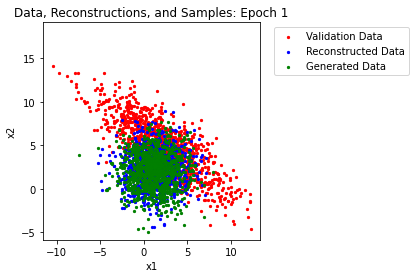

Epoch 2 Average Validation Loss: 10.7024


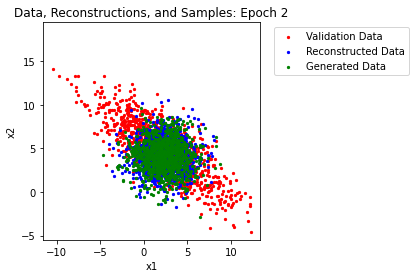

Epoch 3 Average Validation Loss: 10.6012


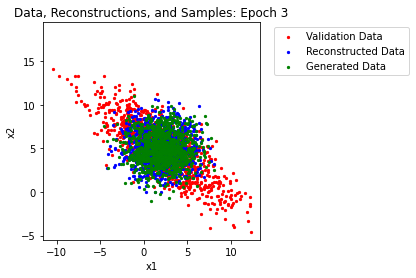

Epoch 4 Average Validation Loss: 10.5938


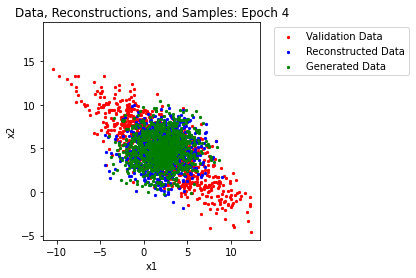

Epoch 5 Average Validation Loss: 10.5864


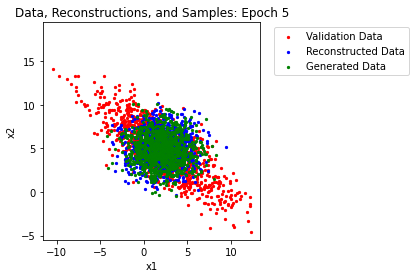

Epoch 6 Average Validation Loss: 10.6119


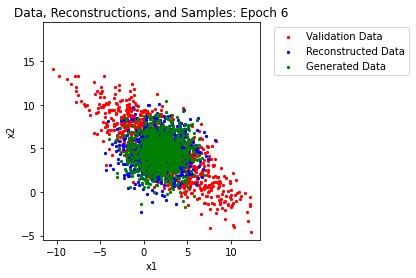

Epoch 7 Average Validation Loss: 10.6474


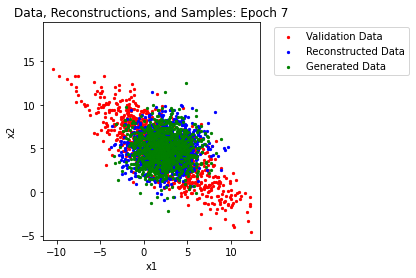

Epoch 8 Average Validation Loss: 10.5816


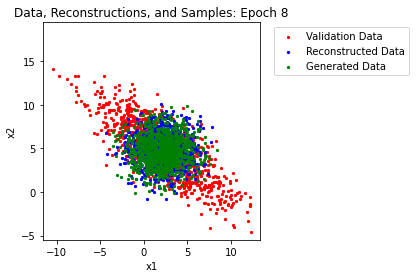

Epoch 9 Average Validation Loss: 10.5612


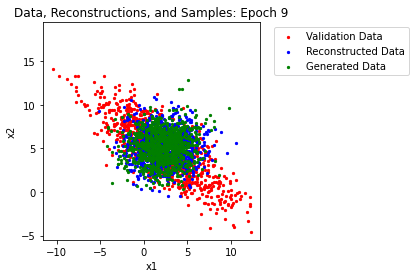

Epoch 10 Average Validation Loss: 10.4407


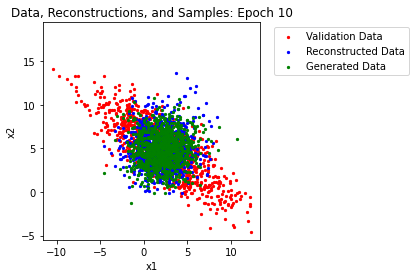

Epoch 11 Average Validation Loss: 10.3116


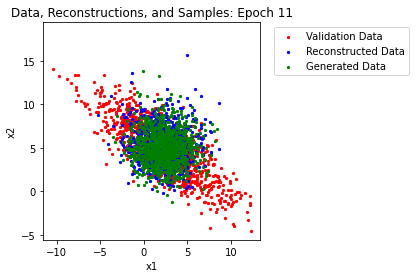

Epoch 12 Average Validation Loss: 9.0802


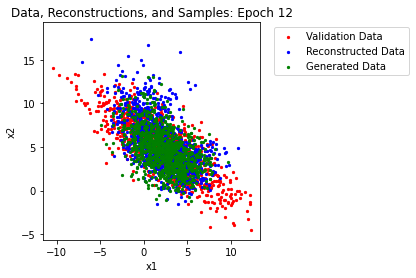

Epoch 13 Average Validation Loss: 8.2355


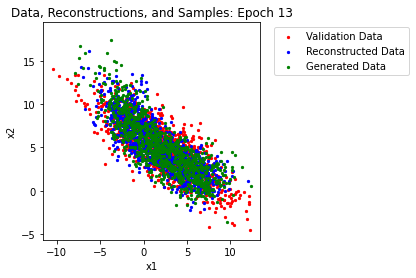

Epoch 14 Average Validation Loss: 8.2305


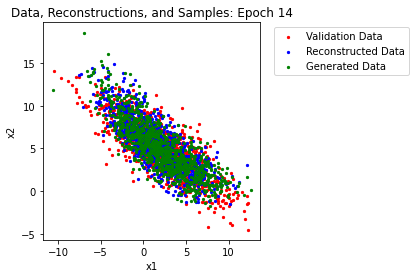

Epoch 15 Average Validation Loss: 7.9128


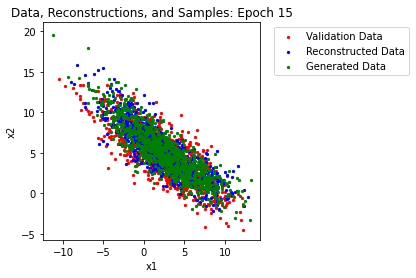

Epoch 16 Average Validation Loss: 8.0137


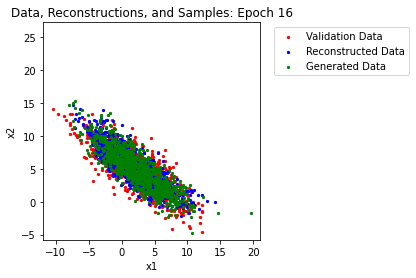

Epoch 17 Average Validation Loss: 7.9543


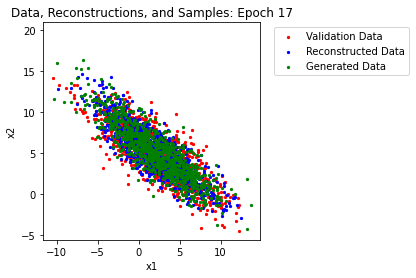

Epoch 18 Average Validation Loss: 8.0198


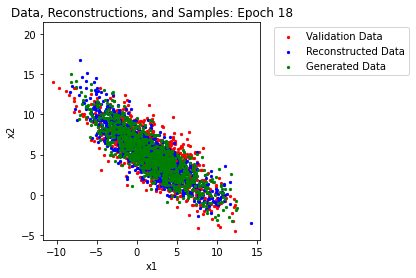

Epoch 19 Average Validation Loss: 7.9202


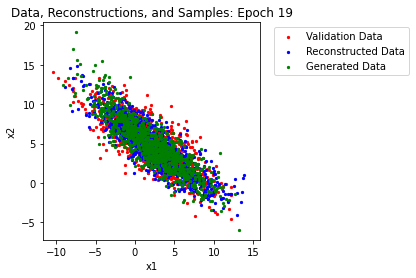

Epoch 20 Average Validation Loss: 8.0677


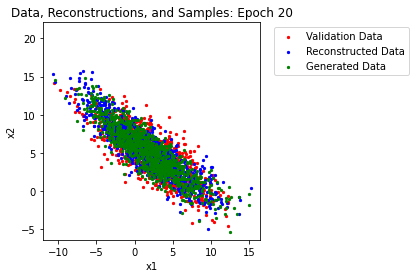

Epoch 21 Average Validation Loss: 7.8591


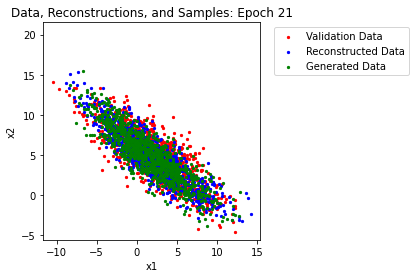

Epoch 22 Average Validation Loss: 7.8462


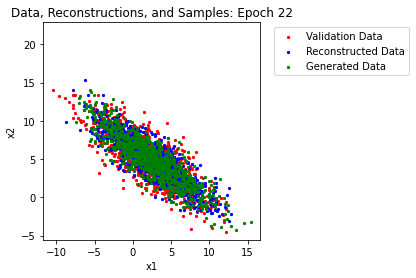

Epoch 23 Average Validation Loss: 7.8449


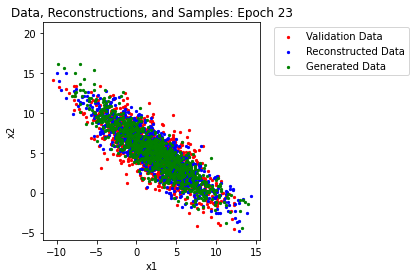

Epoch 24 Average Validation Loss: 7.9809


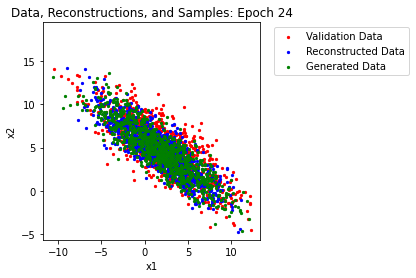

Epoch 25 Average Validation Loss: 7.8852


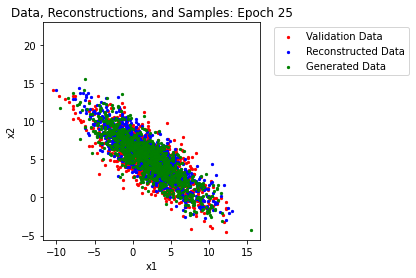

Epoch 26 Average Validation Loss: 7.8968


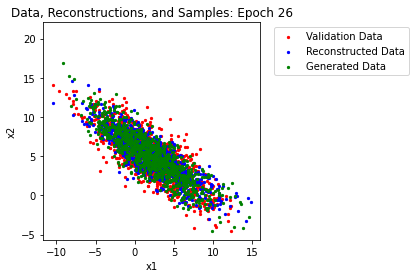

Epoch 27 Average Validation Loss: 7.8539


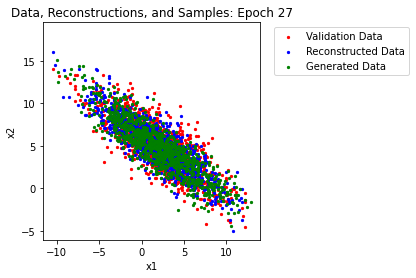

Epoch 28 Average Validation Loss: 7.9287


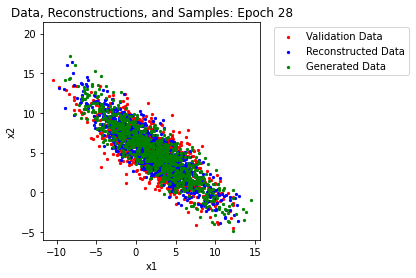

Epoch 29 Average Validation Loss: 8.1068


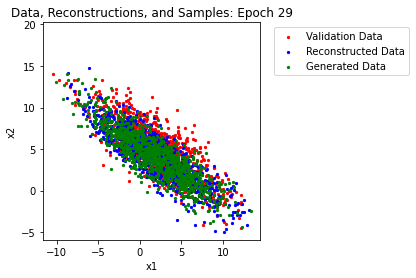

Epoch 30 Average Validation Loss: 7.9583


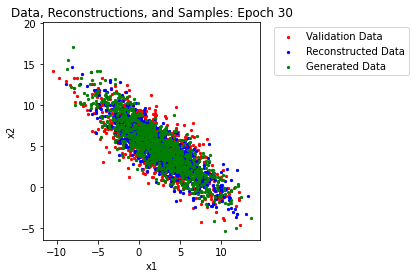

Epoch 31 Average Validation Loss: 7.8675


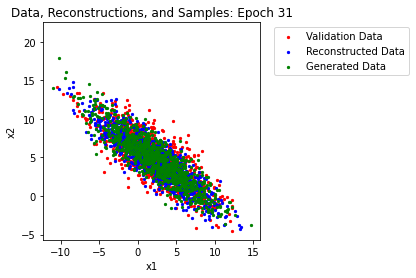

Epoch 32 Average Validation Loss: 7.8768


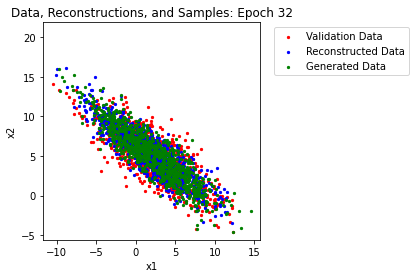

Epoch 33 Average Validation Loss: 7.8559


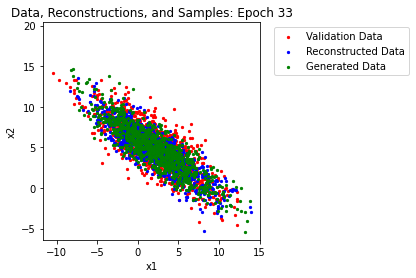

Epoch 34 Average Validation Loss: 7.9189


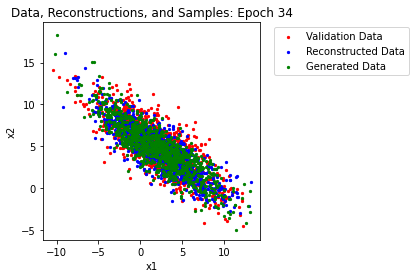

Epoch 35 Average Validation Loss: 7.9160


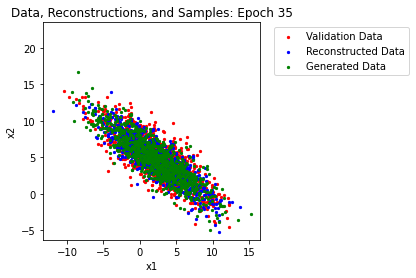

Epoch 36 Average Validation Loss: 7.8286


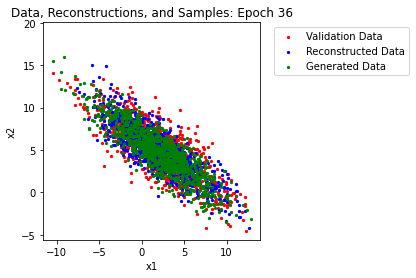

Epoch 37 Average Validation Loss: 7.8236


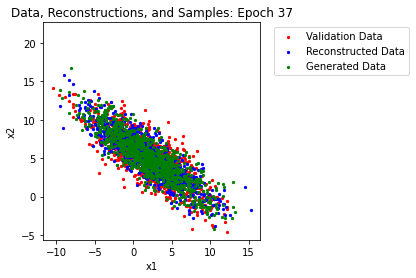

Epoch 38 Average Validation Loss: 7.8405


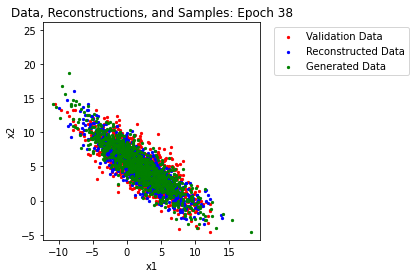

Epoch 39 Average Validation Loss: 7.9024


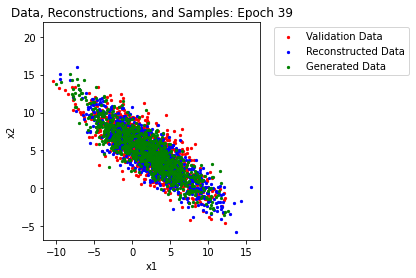

Epoch 40 Average Validation Loss: 7.8704


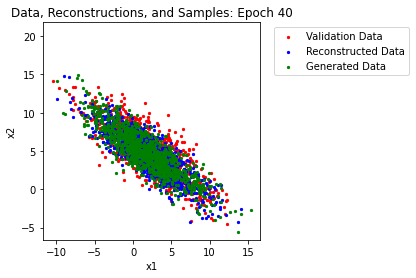

Epoch 41 Average Validation Loss: 7.8726


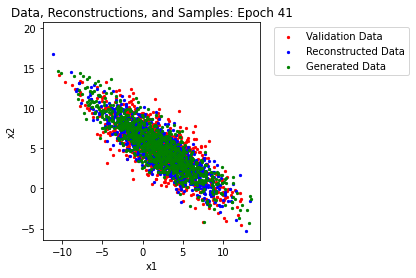

Epoch 42 Average Validation Loss: 8.0041


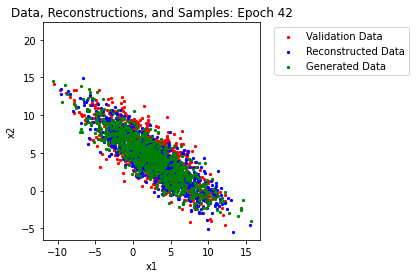

Epoch 43 Average Validation Loss: 7.9175


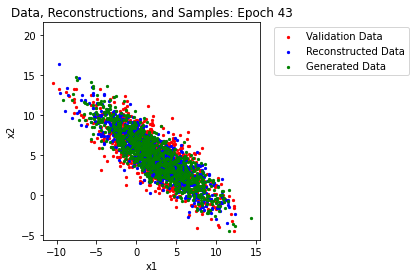

Epoch 44 Average Validation Loss: 7.8797


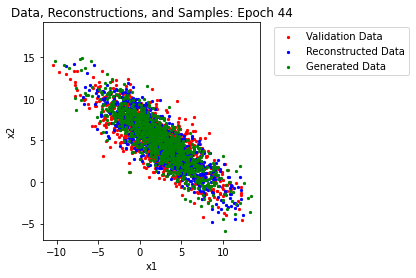

Epoch 45 Average Validation Loss: 7.8677


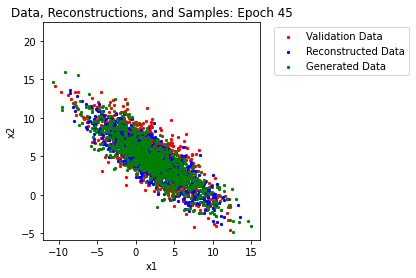

Epoch 46 Average Validation Loss: 7.8645


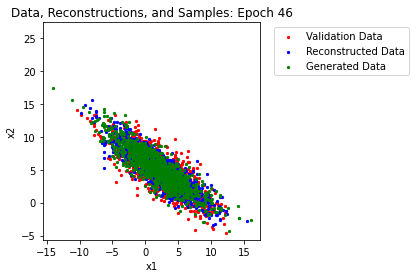

Epoch 47 Average Validation Loss: 7.8818


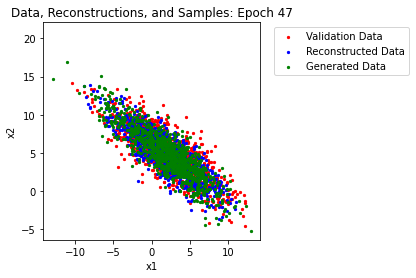

Epoch 48 Average Validation Loss: 7.8424


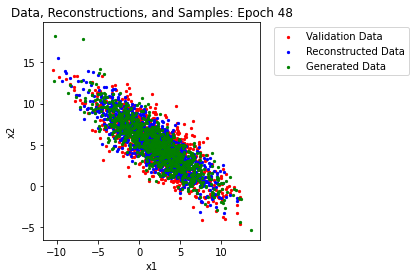

Epoch 49 Average Validation Loss: 7.8101


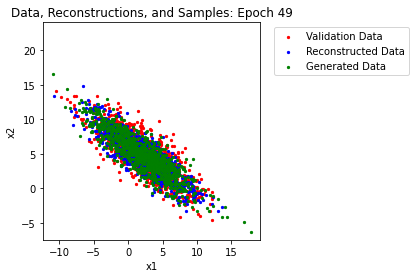

Epoch 50 Average Validation Loss: 7.8649


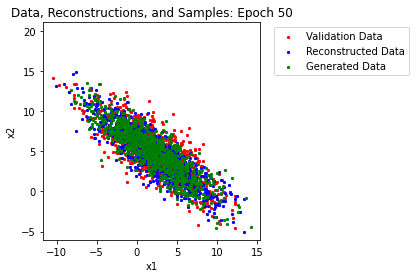

Epoch 51 Average Validation Loss: 7.9287


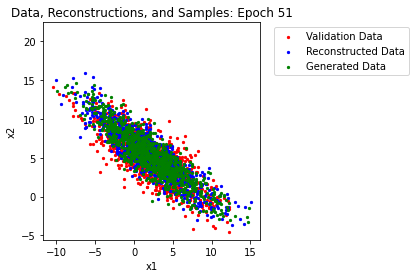

Epoch 52 Average Validation Loss: 7.9198


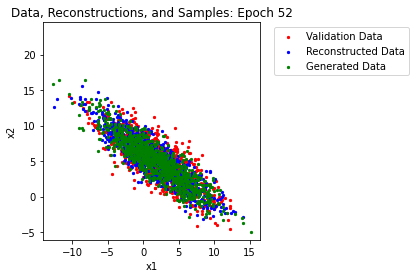

Epoch 53 Average Validation Loss: 7.8265


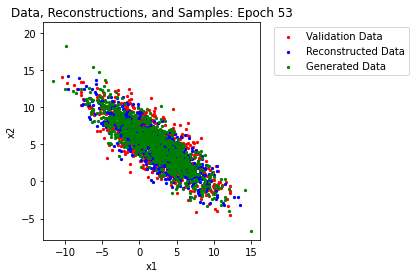

Epoch 54 Average Validation Loss: 7.8529


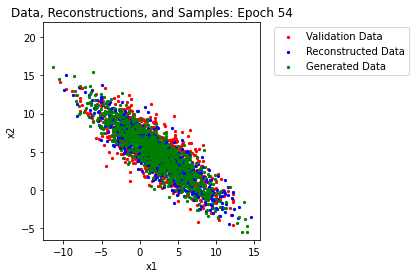

Epoch 55 Average Validation Loss: 7.8537


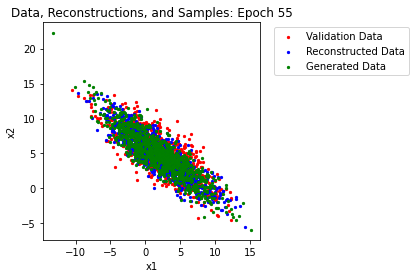

Epoch 56 Average Validation Loss: 7.7928


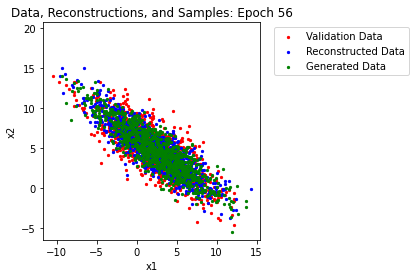

Epoch 57 Average Validation Loss: 7.8172


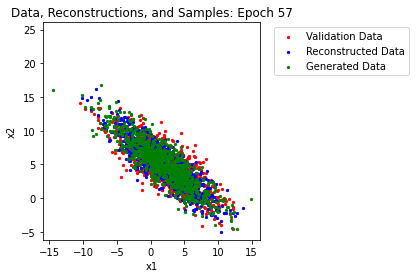

Epoch 58 Average Validation Loss: 7.8014


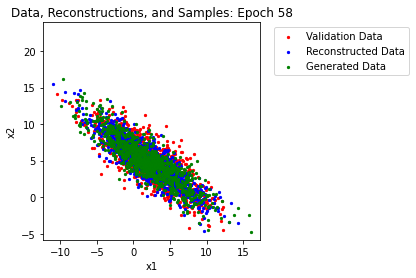

Epoch 59 Average Validation Loss: 7.8246


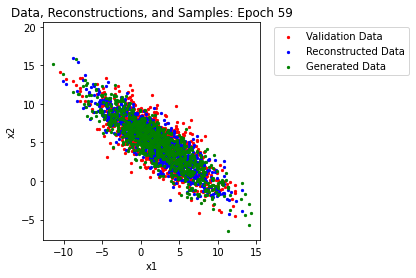

Epoch 60 Average Validation Loss: 7.9597


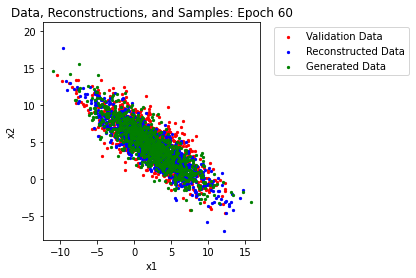

Epoch 61 Average Validation Loss: 7.8391


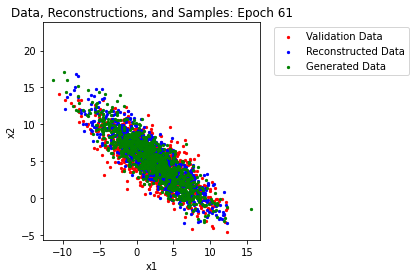

Epoch 62 Average Validation Loss: 7.8339


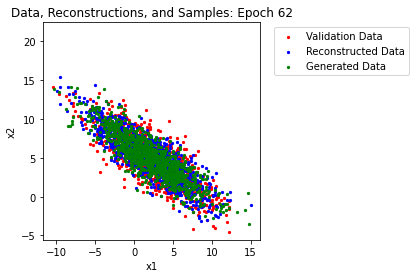

Epoch 63 Average Validation Loss: 7.8897


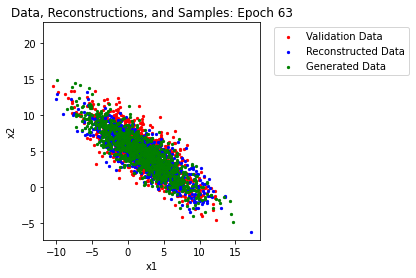

Epoch 64 Average Validation Loss: 7.8971


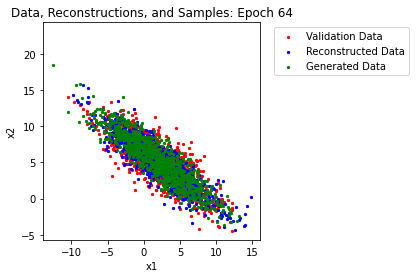

Epoch 65 Average Validation Loss: 7.8648


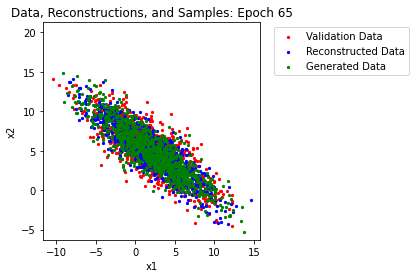

Epoch 66 Average Validation Loss: 7.8531


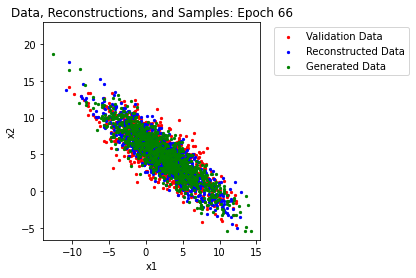

Epoch 67 Average Validation Loss: 7.9287


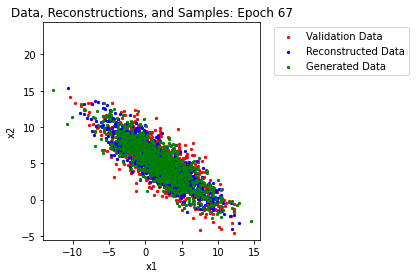

Epoch 68 Average Validation Loss: 7.8747


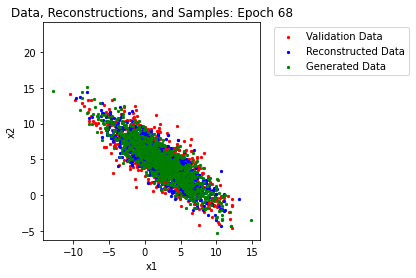

Epoch 69 Average Validation Loss: 7.8160


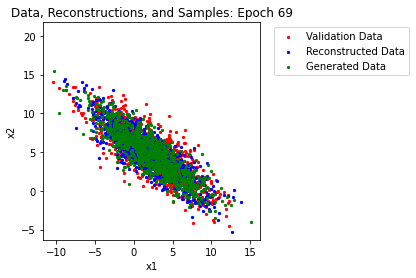

Epoch 70 Average Validation Loss: 7.8271


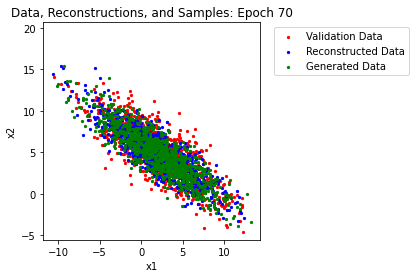

Epoch 71 Average Validation Loss: 7.7958


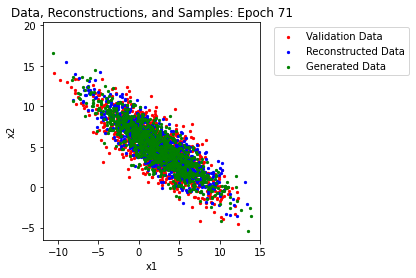

Epoch 72 Average Validation Loss: 7.8131


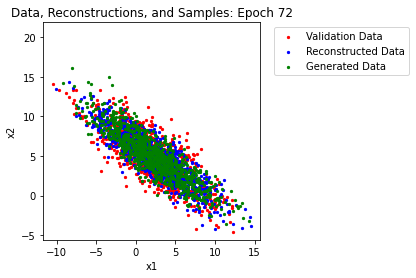

Epoch 73 Average Validation Loss: 7.8992


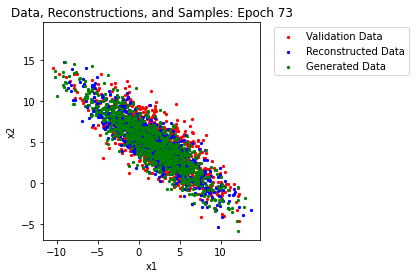

Epoch 74 Average Validation Loss: 7.8653


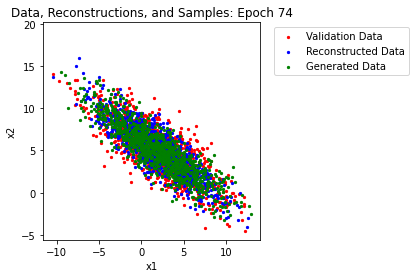

Epoch 75 Average Validation Loss: 7.8836


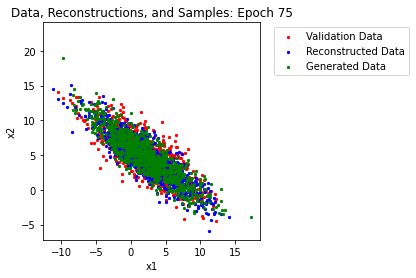

Epoch 76 Average Validation Loss: 7.8393


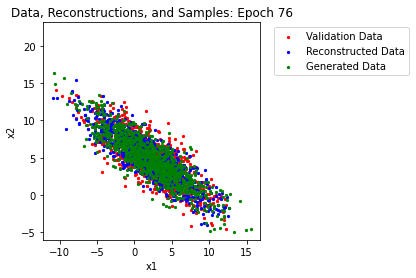

Epoch 77 Average Validation Loss: 7.9091


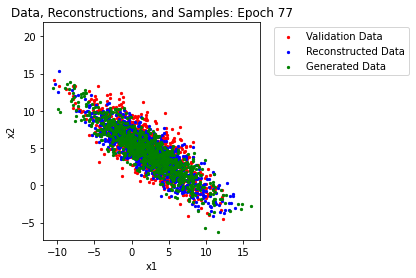

Epoch 78 Average Validation Loss: 7.8372


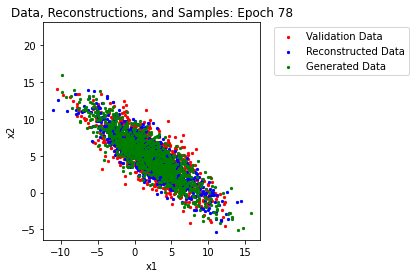

Epoch 79 Average Validation Loss: 7.7851


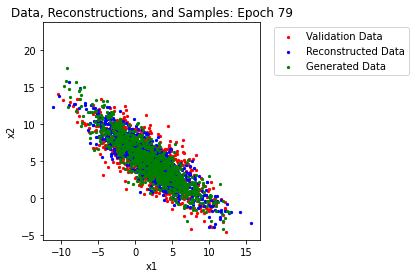

Epoch 80 Average Validation Loss: 7.8789


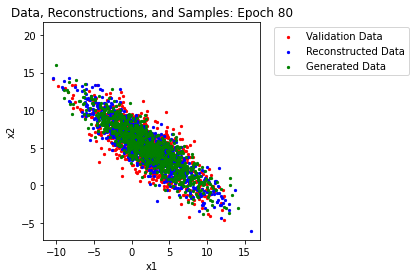

Epoch 81 Average Validation Loss: 7.8166


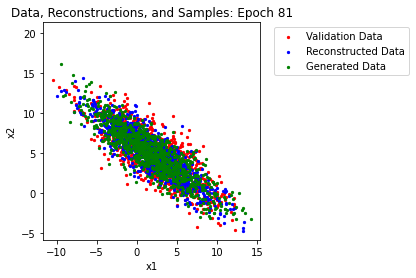

Epoch 82 Average Validation Loss: 7.9465


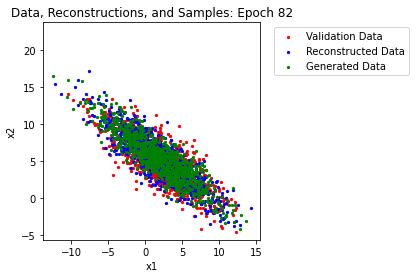

Epoch 83 Average Validation Loss: 7.8137


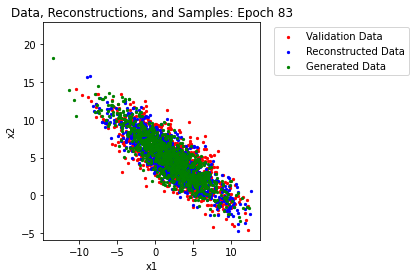

Epoch 84 Average Validation Loss: 7.8549


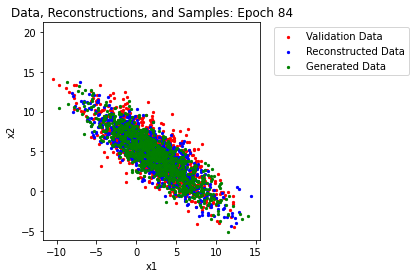

Epoch 85 Average Validation Loss: 7.8359


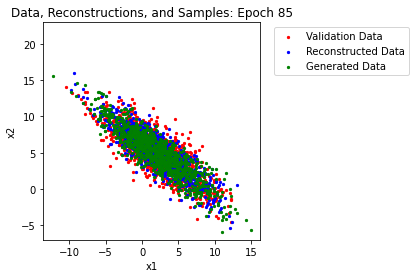

Epoch 86 Average Validation Loss: 7.8573


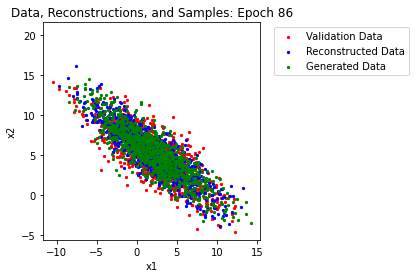

Epoch 87 Average Validation Loss: 7.8752


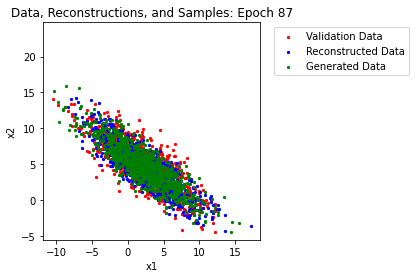

Epoch 88 Average Validation Loss: 7.8705


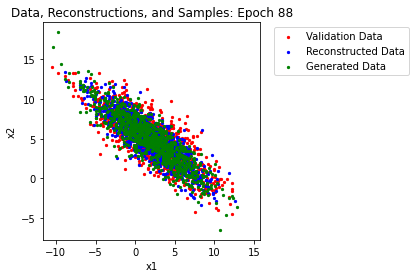

Epoch 89 Average Validation Loss: 8.0529


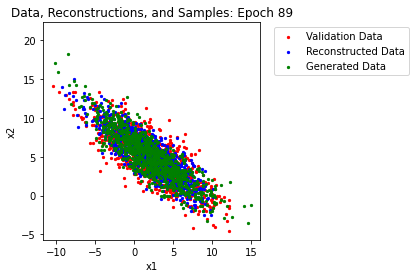

Epoch 90 Average Validation Loss: 7.8891


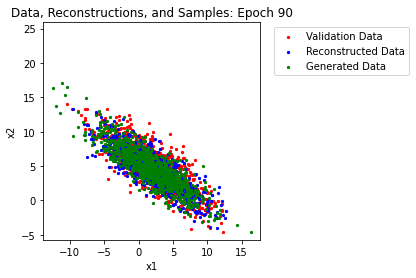

Epoch 91 Average Validation Loss: 7.8601


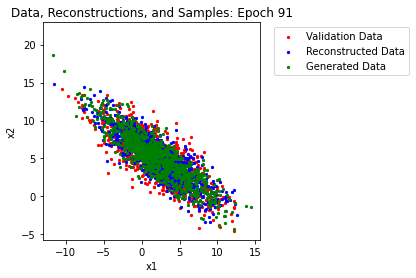

Epoch 92 Average Validation Loss: 7.8335


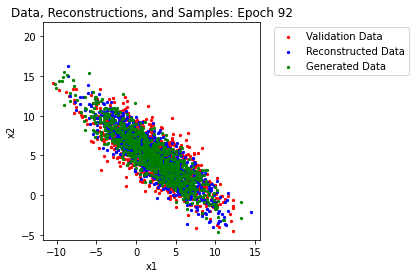

Epoch 93 Average Validation Loss: 7.8638


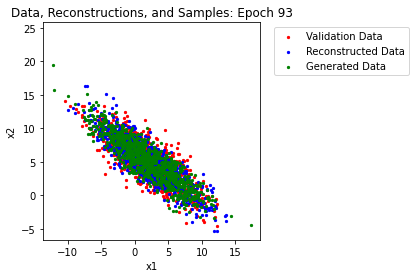

Epoch 94 Average Validation Loss: 7.8910


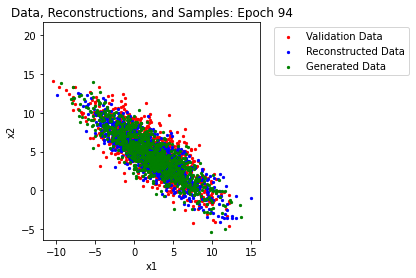

Epoch 95 Average Validation Loss: 7.8342


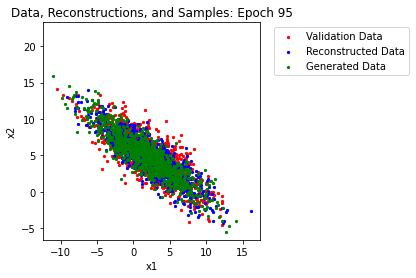

Epoch 96 Average Validation Loss: 7.8691


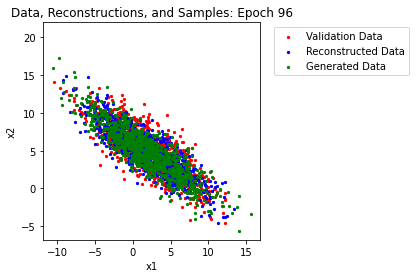

Epoch 97 Average Validation Loss: 7.9131


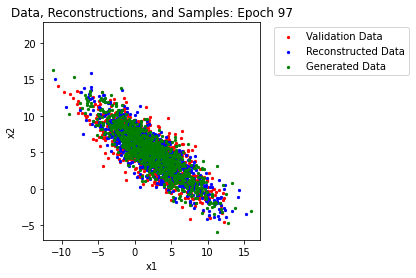

Epoch 98 Average Validation Loss: 7.8147


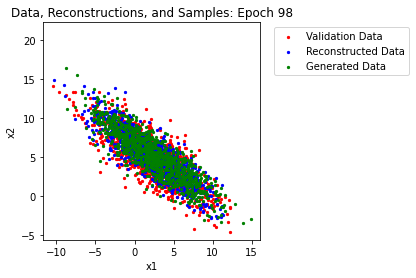

Epoch 99 Average Validation Loss: 7.7922


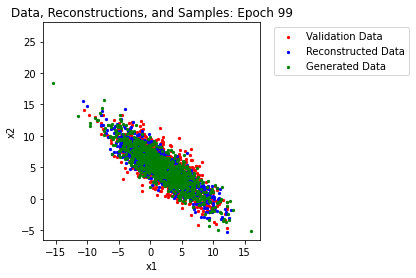

Epoch 100 Average Validation Loss: 7.8583


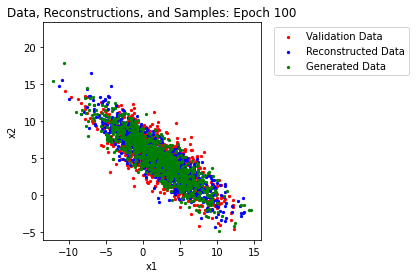

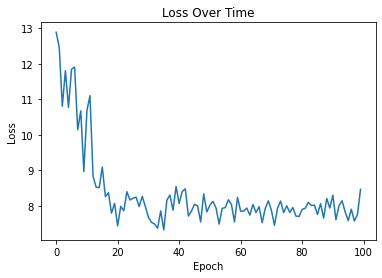

In [14]:
eval(model_list_ex1, loss_list_ex1, valid_loader_ex1, optimizer_ex1)

## 4. Example 2: Learning Two Multivariate Gaussians

The previous example was fairly trivial. Let's see if we can take it further and learn a data distribution which is composed of two independent modes, each a multivariate Gaussian.

### 4.1 Generating Data

In [15]:
# dataset statistics
obs_dim = 2
mu_data_1 = torch.Tensor([2.0, 5.0])
cov_data_1 = torch.Tensor(
    [[15.0, -10.0],
     [-10.0, 10.0]]
)
L_data_1 = torch.linalg.cholesky(cov_data_1)

mu_data_2 = torch.Tensor([18.0, 20.0])
cov_data_2 = torch.Tensor(
    [[5.0, -3.0],
     [-3.0, 20.0]]
)
L_data_2 = torch.linalg.cholesky(cov_data_2)

# generating training and validation sets
num_train_pts = 10000
num_valid_pts = 1000

eps_train_1 = torch.randn(2, num_train_pts // 2)
eps_train_2 = torch.randn(2, num_train_pts // 2)
eps_valid_1 = torch.randn(2, num_valid_pts // 2)
eps_valid_2 = torch.randn(2, num_valid_pts // 2)

train_data_1 = mu_data_1 + (L_data_1 @ eps_train_1).transpose(-1, -2)
train_data_2 = mu_data_2 + (L_data_2 @ eps_train_2).transpose(-1, -2)
valid_data_1 = mu_data_1 + (L_data_1 @ eps_valid_1).transpose(-1, -2)
valid_data_2 = mu_data_2 + (L_data_2 @ eps_valid_2).transpose(-1, -2)

train_data_ex2 = torch.cat([train_data_1, train_data_2], dim=0)
valid_data_ex2 = torch.cat([valid_data_1, valid_data_2], dim=0)

### 4.2 Training Settings

In [16]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 100
lr = 1e-3  # initial learning rate
step_size = 10  # steps per decay for lr scheduler
gamma = 0.9  # multiplicative decay for lr scheduler

In [17]:
# preparing dataloaders, optimizer, and scheduler
model_ex2 = VAE1(latent_dim, obs_dim)
train_loader_ex2 = torch.utils.data.DataLoader(
    train_data_ex2,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex2 = torch.utils.data.DataLoader(
    valid_data_ex2,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex2 = optim.Adam(model_ex2.parameters(), lr=lr)
scheduler_ex2 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex2, step_size=step_size, gamma=gamma)

### 4.3 Training

In [18]:
model_list_ex2, loss_list_ex2 = train(
    model_ex2,
    epochs,
    train_loader_ex2,
    optimizer_ex2,
    scheduler=scheduler_ex2
)

Epoch: 1	Iteration: 10	Loss: 235.1979
Epoch: 1	Iteration: 20	Loss: 194.2687
Epoch: 1	Iteration: 30	Loss: 242.6537
Epoch: 1	Iteration: 40	Loss: 158.8551
Epoch: 1	Iteration: 50	Loss: 104.2568
Epoch: 1	Iteration: 60	Loss: 60.6827
Epoch: 1	Iteration: 70	Loss: 49.4294
Epoch: 1	Iteration: 80	Loss: 52.3130
Epoch: 1	Iteration: 90	Loss: 42.3303
Epoch: 1	Iteration: 100	Loss: 29.3988
Epoch: 1	Iteration: 110	Loss: 30.1849
Epoch: 1	Iteration: 120	Loss: 38.9695
Epoch: 1	Iteration: 130	Loss: 38.1574
Epoch: 1	Iteration: 140	Loss: 41.3456
Epoch: 1	Iteration: 150	Loss: 31.2676
Epoch: 1	Iteration: 160	Loss: 29.6308
Epoch: 1	Iteration: 170	Loss: 30.3345
Epoch: 1	Iteration: 180	Loss: 30.9972
Epoch: 1	Iteration: 190	Loss: 33.2298
Epoch: 1	Iteration: 200	Loss: 26.6387
Epoch: 1	Iteration: 210	Loss: 25.4139
Epoch: 1	Iteration: 220	Loss: 26.2585
Epoch: 1	Iteration: 230	Loss: 26.7905
Epoch: 1	Iteration: 240	Loss: 28.1022
Epoch: 1	Iteration: 250	Loss: 26.2484
Epoch: 1	Iteration: 260	Loss: 24.6869
Epoch: 1	Iterati

Epoch: 8	Iteration: 2230	Loss: 11.5755
Epoch: 8	Iteration: 2240	Loss: 11.4100
Epoch: 8	Iteration: 2250	Loss: 11.4258
Epoch: 8	Iteration: 2260	Loss: 13.2758
Epoch: 8	Iteration: 2270	Loss: 11.5404
Epoch: 8	Iteration: 2280	Loss: 12.3995
Epoch: 8	Iteration: 2290	Loss: 11.3983
Epoch: 8	Iteration: 2300	Loss: 11.4036
Epoch: 8	Iteration: 2310	Loss: 11.9740
Epoch: 8	Iteration: 2320	Loss: 12.4435
Epoch: 8	Iteration: 2330	Loss: 11.5565
Epoch: 8	Iteration: 2340	Loss: 13.8081
Epoch: 8	Iteration: 2350	Loss: 12.7557
Epoch: 8	Iteration: 2360	Loss: 11.4676
Epoch: 8	Iteration: 2370	Loss: 12.0038
Epoch: 8	Iteration: 2380	Loss: 12.2389
Epoch: 8	Iteration: 2390	Loss: 11.1220
Epoch: 8	Iteration: 2400	Loss: 10.8590
Epoch: 8	Iteration: 2410	Loss: 11.4293
Epoch: 8	Iteration: 2420	Loss: 10.3662
Epoch: 8	Iteration: 2430	Loss: 12.4513
Epoch: 8	Iteration: 2440	Loss: 10.4434
Epoch: 8	Iteration: 2450	Loss: 11.5132
Epoch: 8	Iteration: 2460	Loss: 11.7116
Epoch: 8	Iteration: 2470	Loss: 12.0712
Epoch: 8	Iteration: 2480	

Epoch: 15	Iteration: 4400	Loss: 10.1979
Epoch: 15	Iteration: 4410	Loss: 8.6714
Epoch: 15	Iteration: 4420	Loss: 9.5116
Epoch: 15	Iteration: 4430	Loss: 10.1415
Epoch: 15	Iteration: 4440	Loss: 9.9563
Epoch: 15	Iteration: 4450	Loss: 9.3307
Epoch: 15	Iteration: 4460	Loss: 9.0595
Epoch: 15	Iteration: 4470	Loss: 9.0723
Epoch: 15	Iteration: 4480	Loss: 9.0315
Epoch: 15	Iteration: 4490	Loss: 8.8620
Epoch: 15	Iteration: 4500	Loss: 9.3010
Epoch: 15	Iteration: 4510	Loss: 9.3931
Epoch: 15	Iteration: 4520	Loss: 9.0850
Epoch: 15	Iteration: 4530	Loss: 9.1935
Epoch: 15	Iteration: 4540	Loss: 9.4209
Epoch: 15	Iteration: 4550	Loss: 9.3828
Epoch: 15	Iteration: 4560	Loss: 9.6540
Epoch: 15	Iteration: 4570	Loss: 9.2776
Epoch: 15	Iteration: 4580	Loss: 9.5848
Epoch: 15	Iteration: 4590	Loss: 9.3296
Epoch: 15	Iteration: 4600	Loss: 9.3940
Epoch: 15	Iteration: 4610	Loss: 9.6925
Epoch: 15	Iteration: 4620	Loss: 9.5791
Epoch: 15	Iteration: 4630	Loss: 9.1074
Epoch: 15	Iteration: 4640	Loss: 9.1559
Epoch: 15	Iteration: 46

Epoch: 22	Iteration: 6580	Loss: 9.1963
Epoch: 22	Iteration: 6590	Loss: 8.9491
Epoch: 22	Iteration: 6600	Loss: 8.6498
Epoch: 22	Iteration: 6610	Loss: 8.9132
Epoch: 22	Iteration: 6620	Loss: 8.9251
Epoch: 22	Iteration: 6630	Loss: 9.1377
Epoch: 22	Iteration: 6640	Loss: 9.8893
Epoch: 22	Iteration: 6650	Loss: 9.4236
Epoch: 22	Iteration: 6660	Loss: 8.8673
Epoch: 22	Iteration: 6670	Loss: 8.8289
Epoch: 22	Iteration: 6680	Loss: 8.7903
Epoch: 22	Iteration: 6690	Loss: 8.8990
Epoch: 22	Iteration: 6700	Loss: 8.5265
Epoch: 22	Iteration: 6710	Loss: 8.9207
Epoch: 22	Iteration: 6720	Loss: 9.7604
Epoch: 22	Iteration: 6730	Loss: 9.3184
Epoch: 22	Iteration: 6740	Loss: 9.1608
Epoch: 22	Iteration: 6750	Loss: 8.9524
Epoch: 22	Iteration: 6760	Loss: 9.2276
Epoch: 22	Iteration: 6770	Loss: 9.3227
Epoch: 22	Iteration: 6780	Loss: 9.0088
Epoch: 22	Iteration: 6790	Loss: 8.7797
Epoch: 22	Iteration: 6800	Loss: 9.3349
Epoch: 22	Iteration: 6810	Loss: 9.2588
Epoch: 22	Iteration: 6820	Loss: 8.8422
Epoch: 22	Iteration: 6830

Epoch: 28	Iteration: 8710	Loss: 9.0432
Epoch: 28	Iteration: 8720	Loss: 8.8990
Epoch: 28	Iteration: 8730	Loss: 9.0347
Epoch: 29	Iteration: 8740	Loss: 8.5238
Epoch: 29	Iteration: 8750	Loss: 8.6394
Epoch: 29	Iteration: 8760	Loss: 8.9261
Epoch: 29	Iteration: 8770	Loss: 8.5298
Epoch: 29	Iteration: 8780	Loss: 9.3918
Epoch: 29	Iteration: 8790	Loss: 9.1139
Epoch: 29	Iteration: 8800	Loss: 8.9277
Epoch: 29	Iteration: 8810	Loss: 8.8081
Epoch: 29	Iteration: 8820	Loss: 8.9709
Epoch: 29	Iteration: 8830	Loss: 8.8153
Epoch: 29	Iteration: 8840	Loss: 8.8074
Epoch: 29	Iteration: 8850	Loss: 8.9389
Epoch: 29	Iteration: 8860	Loss: 9.2177
Epoch: 29	Iteration: 8870	Loss: 9.4487
Epoch: 29	Iteration: 8880	Loss: 9.0716
Epoch: 29	Iteration: 8890	Loss: 9.1705
Epoch: 29	Iteration: 8900	Loss: 9.6385
Epoch: 29	Iteration: 8910	Loss: 9.0589
Epoch: 29	Iteration: 8920	Loss: 8.9838
Epoch: 29	Iteration: 8930	Loss: 9.0024
Epoch: 29	Iteration: 8940	Loss: 9.0415
Epoch: 29	Iteration: 8950	Loss: 9.2074
Epoch: 29	Iteration: 8960

Epoch: 35	Iteration: 10820	Loss: 8.8078
Epoch: 35	Iteration: 10830	Loss: 8.6531
Epoch: 35	Iteration: 10840	Loss: 8.6297
Epoch: 35	Iteration: 10850	Loss: 8.7208
Epoch: 35	Iteration: 10860	Loss: 8.7864
Epoch: 35	Iteration: 10870	Loss: 8.5328
Epoch: 35	Iteration: 10880	Loss: 9.4102
Epoch: 35	Iteration: 10890	Loss: 8.6984
Epoch: 35	Iteration: 10900	Loss: 9.2756
Epoch: 35	Iteration: 10910	Loss: 9.6440
Epoch: 35	Iteration: 10920	Loss: 8.4397
Epoch: 36	Iteration: 10930	Loss: 9.0293
Epoch: 36	Iteration: 10940	Loss: 8.7159
Epoch: 36	Iteration: 10950	Loss: 8.6031
Epoch: 36	Iteration: 10960	Loss: 8.8028
Epoch: 36	Iteration: 10970	Loss: 8.9460
Epoch: 36	Iteration: 10980	Loss: 9.1847
Epoch: 36	Iteration: 10990	Loss: 8.9271
Epoch: 36	Iteration: 11000	Loss: 9.0853
Epoch: 36	Iteration: 11010	Loss: 9.3328
Epoch: 36	Iteration: 11020	Loss: 9.1223
Epoch: 36	Iteration: 11030	Loss: 9.2178
Epoch: 36	Iteration: 11040	Loss: 8.7965
Epoch: 36	Iteration: 11050	Loss: 8.9955
Epoch: 36	Iteration: 11060	Loss: 8.8664


Epoch: 42	Iteration: 12960	Loss: 8.7197
Epoch: 42	Iteration: 12970	Loss: 8.2549
Epoch: 42	Iteration: 12980	Loss: 8.6136
Epoch: 42	Iteration: 12990	Loss: 8.6785
Epoch: 42	Iteration: 13000	Loss: 8.6997
Epoch: 42	Iteration: 13010	Loss: 9.3688
Epoch: 42	Iteration: 13020	Loss: 9.1381
Epoch: 42	Iteration: 13030	Loss: 8.2285
Epoch: 42	Iteration: 13040	Loss: 9.0961
Epoch: 42	Iteration: 13050	Loss: 8.8624
Epoch: 42	Iteration: 13060	Loss: 8.9346
Epoch: 42	Iteration: 13070	Loss: 8.9211
Epoch: 42	Iteration: 13080	Loss: 8.5487
Epoch: 42	Iteration: 13090	Loss: 8.8744
Epoch: 42	Iteration: 13100	Loss: 8.9082
Epoch: 43	Iteration: 13110	Loss: 9.5905
Epoch: 43	Iteration: 13120	Loss: 9.0920
Epoch: 43	Iteration: 13130	Loss: 8.6945
Epoch: 43	Iteration: 13140	Loss: 8.9844
Epoch: 43	Iteration: 13150	Loss: 8.4899
Epoch: 43	Iteration: 13160	Loss: 8.5079
Epoch: 43	Iteration: 13170	Loss: 8.8746
Epoch: 43	Iteration: 13180	Loss: 8.5659
Epoch: 43	Iteration: 13190	Loss: 9.0082
Epoch: 43	Iteration: 13200	Loss: 9.0337


Epoch: 49	Iteration: 15020	Loss: 8.8865
Epoch: 49	Iteration: 15030	Loss: 8.6758
Epoch: 49	Iteration: 15040	Loss: 9.1087
Epoch: 49	Iteration: 15050	Loss: 8.8093
Epoch: 49	Iteration: 15060	Loss: 8.8134
Epoch: 49	Iteration: 15070	Loss: 9.0416
Epoch: 49	Iteration: 15080	Loss: 8.7077
Epoch: 49	Iteration: 15090	Loss: 9.0607
Epoch: 49	Iteration: 15100	Loss: 8.5923
Epoch: 49	Iteration: 15110	Loss: 8.5609
Epoch: 49	Iteration: 15120	Loss: 8.5532
Epoch: 49	Iteration: 15130	Loss: 8.9791
Epoch: 49	Iteration: 15140	Loss: 8.4859
Epoch: 49	Iteration: 15150	Loss: 8.7131
Epoch: 49	Iteration: 15160	Loss: 9.0083
Epoch: 49	Iteration: 15170	Loss: 8.7568
Epoch: 49	Iteration: 15180	Loss: 8.6824
Epoch: 49	Iteration: 15190	Loss: 9.0767
Epoch: 49	Iteration: 15200	Loss: 9.0552
Epoch: 49	Iteration: 15210	Loss: 8.4569
Epoch: 49	Iteration: 15220	Loss: 8.3854
Epoch: 49	Iteration: 15230	Loss: 8.8014
Epoch: 49	Iteration: 15240	Loss: 8.6178
Epoch: 49	Iteration: 15250	Loss: 8.6287
Epoch: 49	Iteration: 15260	Loss: 8.6341


Epoch: 55	Iteration: 17070	Loss: 8.7663
Epoch: 55	Iteration: 17080	Loss: 8.7248
Epoch: 55	Iteration: 17090	Loss: 8.6632
Epoch: 55	Iteration: 17100	Loss: 9.5264
Epoch: 55	Iteration: 17110	Loss: 8.8245
Epoch: 55	Iteration: 17120	Loss: 8.4558
Epoch: 55	Iteration: 17130	Loss: 8.6429
Epoch: 55	Iteration: 17140	Loss: 8.4351
Epoch: 55	Iteration: 17150	Loss: 8.5631
Epoch: 55	Iteration: 17160	Loss: 8.6289
Epoch: 56	Iteration: 17170	Loss: 8.8193
Epoch: 56	Iteration: 17180	Loss: 8.7567
Epoch: 56	Iteration: 17190	Loss: 9.6046
Epoch: 56	Iteration: 17200	Loss: 9.0410
Epoch: 56	Iteration: 17210	Loss: 8.9033
Epoch: 56	Iteration: 17220	Loss: 8.3047
Epoch: 56	Iteration: 17230	Loss: 9.1163
Epoch: 56	Iteration: 17240	Loss: 9.1223
Epoch: 56	Iteration: 17250	Loss: 8.6071
Epoch: 56	Iteration: 17260	Loss: 8.5843
Epoch: 56	Iteration: 17270	Loss: 8.9371
Epoch: 56	Iteration: 17280	Loss: 9.1159
Epoch: 56	Iteration: 17290	Loss: 9.1530
Epoch: 56	Iteration: 17300	Loss: 8.5602
Epoch: 56	Iteration: 17310	Loss: 9.2073


Epoch: 62	Iteration: 19150	Loss: 8.7030
Epoch: 62	Iteration: 19160	Loss: 8.8711
Epoch: 62	Iteration: 19170	Loss: 9.0022
Epoch: 62	Iteration: 19180	Loss: 8.5734
Epoch: 62	Iteration: 19190	Loss: 8.4020
Epoch: 62	Iteration: 19200	Loss: 9.0011
Epoch: 62	Iteration: 19210	Loss: 8.7567
Epoch: 62	Iteration: 19220	Loss: 8.4586
Epoch: 62	Iteration: 19230	Loss: 8.3739
Epoch: 62	Iteration: 19240	Loss: 8.6105
Epoch: 62	Iteration: 19250	Loss: 8.6269
Epoch: 62	Iteration: 19260	Loss: 8.7433
Epoch: 62	Iteration: 19270	Loss: 8.1908
Epoch: 62	Iteration: 19280	Loss: 8.0507
Epoch: 62	Iteration: 19290	Loss: 8.7123
Epoch: 62	Iteration: 19300	Loss: 9.4523
Epoch: 62	Iteration: 19310	Loss: 8.7328
Epoch: 62	Iteration: 19320	Loss: 8.6254
Epoch: 62	Iteration: 19330	Loss: 8.6534
Epoch: 62	Iteration: 19340	Loss: 9.2924
Epoch: 63	Iteration: 19350	Loss: 8.4479
Epoch: 63	Iteration: 19360	Loss: 8.9645
Epoch: 63	Iteration: 19370	Loss: 8.9434
Epoch: 63	Iteration: 19380	Loss: 8.6061
Epoch: 63	Iteration: 19390	Loss: 9.5124


Epoch: 69	Iteration: 21260	Loss: 8.5886
Epoch: 69	Iteration: 21270	Loss: 8.6972
Epoch: 69	Iteration: 21280	Loss: 8.5048
Epoch: 69	Iteration: 21290	Loss: 8.2280
Epoch: 69	Iteration: 21300	Loss: 8.9799
Epoch: 69	Iteration: 21310	Loss: 8.6456
Epoch: 69	Iteration: 21320	Loss: 9.0080
Epoch: 69	Iteration: 21330	Loss: 8.8872
Epoch: 69	Iteration: 21340	Loss: 9.5305
Epoch: 69	Iteration: 21350	Loss: 8.9540
Epoch: 69	Iteration: 21360	Loss: 8.8847
Epoch: 69	Iteration: 21370	Loss: 8.7475
Epoch: 69	Iteration: 21380	Loss: 8.8742
Epoch: 69	Iteration: 21390	Loss: 8.6368
Epoch: 69	Iteration: 21400	Loss: 8.5246
Epoch: 69	Iteration: 21410	Loss: 8.5290
Epoch: 69	Iteration: 21420	Loss: 8.6579
Epoch: 69	Iteration: 21430	Loss: 8.9083
Epoch: 69	Iteration: 21440	Loss: 8.6694
Epoch: 69	Iteration: 21450	Loss: 8.1440
Epoch: 69	Iteration: 21460	Loss: 8.7987
Epoch: 69	Iteration: 21470	Loss: 8.7015
Epoch: 69	Iteration: 21480	Loss: 8.7246
Epoch: 69	Iteration: 21490	Loss: 8.2300
Epoch: 69	Iteration: 21500	Loss: 8.7911


Epoch: 75	Iteration: 23370	Loss: 8.5898
Epoch: 75	Iteration: 23380	Loss: 8.6378
Epoch: 75	Iteration: 23390	Loss: 8.7386
Epoch: 75	Iteration: 23400	Loss: 8.9413
Epoch: 76	Iteration: 23410	Loss: 9.1046
Epoch: 76	Iteration: 23420	Loss: 8.9762
Epoch: 76	Iteration: 23430	Loss: 8.5284
Epoch: 76	Iteration: 23440	Loss: 8.7353
Epoch: 76	Iteration: 23450	Loss: 8.7872
Epoch: 76	Iteration: 23460	Loss: 8.8156
Epoch: 76	Iteration: 23470	Loss: 8.8219
Epoch: 76	Iteration: 23480	Loss: 8.8446
Epoch: 76	Iteration: 23490	Loss: 8.6404
Epoch: 76	Iteration: 23500	Loss: 8.7809
Epoch: 76	Iteration: 23510	Loss: 8.3827
Epoch: 76	Iteration: 23520	Loss: 8.8392
Epoch: 76	Iteration: 23530	Loss: 8.5343
Epoch: 76	Iteration: 23540	Loss: 8.4463
Epoch: 76	Iteration: 23550	Loss: 8.9238
Epoch: 76	Iteration: 23560	Loss: 8.7546
Epoch: 76	Iteration: 23570	Loss: 8.8271
Epoch: 76	Iteration: 23580	Loss: 8.7363
Epoch: 76	Iteration: 23590	Loss: 8.6687
Epoch: 76	Iteration: 23600	Loss: 8.5750
Epoch: 76	Iteration: 23610	Loss: 8.5709


Epoch: 82	Iteration: 25450	Loss: 8.9046
Epoch: 82	Iteration: 25460	Loss: 8.7871
Epoch: 82	Iteration: 25470	Loss: 8.4701
Epoch: 82	Iteration: 25480	Loss: 8.7030
Epoch: 82	Iteration: 25490	Loss: 8.7018
Epoch: 82	Iteration: 25500	Loss: 8.5551
Epoch: 82	Iteration: 25510	Loss: 8.2272
Epoch: 82	Iteration: 25520	Loss: 8.6616
Epoch: 82	Iteration: 25530	Loss: 8.2290
Epoch: 82	Iteration: 25540	Loss: 8.3156
Epoch: 82	Iteration: 25550	Loss: 8.3945
Epoch: 82	Iteration: 25560	Loss: 8.9564
Epoch: 82	Iteration: 25570	Loss: 8.6691
Epoch: 82	Iteration: 25580	Loss: 8.3105
Epoch: 83	Iteration: 25590	Loss: 8.4136
Epoch: 83	Iteration: 25600	Loss: 8.1246
Epoch: 83	Iteration: 25610	Loss: 8.4757
Epoch: 83	Iteration: 25620	Loss: 8.4547
Epoch: 83	Iteration: 25630	Loss: 8.5096
Epoch: 83	Iteration: 25640	Loss: 9.0582
Epoch: 83	Iteration: 25650	Loss: 9.1258
Epoch: 83	Iteration: 25660	Loss: 8.5747
Epoch: 83	Iteration: 25670	Loss: 8.7522
Epoch: 83	Iteration: 25680	Loss: 8.7300
Epoch: 83	Iteration: 25690	Loss: 8.9496


Epoch: 89	Iteration: 27510	Loss: 8.5924
Epoch: 89	Iteration: 27520	Loss: 8.3112
Epoch: 89	Iteration: 27530	Loss: 8.5704
Epoch: 89	Iteration: 27540	Loss: 8.8702
Epoch: 89	Iteration: 27550	Loss: 8.4591
Epoch: 89	Iteration: 27560	Loss: 8.2391
Epoch: 89	Iteration: 27570	Loss: 8.5525
Epoch: 89	Iteration: 27580	Loss: 8.1565
Epoch: 89	Iteration: 27590	Loss: 9.3761
Epoch: 89	Iteration: 27600	Loss: 8.6309
Epoch: 89	Iteration: 27610	Loss: 8.3036
Epoch: 89	Iteration: 27620	Loss: 8.4304
Epoch: 89	Iteration: 27630	Loss: 8.4670
Epoch: 89	Iteration: 27640	Loss: 8.7658
Epoch: 89	Iteration: 27650	Loss: 8.5150
Epoch: 89	Iteration: 27660	Loss: 8.1822
Epoch: 89	Iteration: 27670	Loss: 8.7680
Epoch: 89	Iteration: 27680	Loss: 8.5706
Epoch: 89	Iteration: 27690	Loss: 8.3123
Epoch: 89	Iteration: 27700	Loss: 8.4062
Epoch: 89	Iteration: 27710	Loss: 8.4271
Epoch: 89	Iteration: 27720	Loss: 8.4710
Epoch: 89	Iteration: 27730	Loss: 8.8318
Epoch: 89	Iteration: 27740	Loss: 9.0423
Epoch: 89	Iteration: 27750	Loss: 8.4011


Epoch: 95	Iteration: 29580	Loss: 8.4163
Epoch: 95	Iteration: 29590	Loss: 8.8650
Epoch: 95	Iteration: 29600	Loss: 8.7271
Epoch: 95	Iteration: 29610	Loss: 8.2052
Epoch: 95	Iteration: 29620	Loss: 8.2057
Epoch: 95	Iteration: 29630	Loss: 8.5516
Epoch: 95	Iteration: 29640	Loss: 8.5476
Epoch: 96	Iteration: 29650	Loss: 9.0112
Epoch: 96	Iteration: 29660	Loss: 8.6556
Epoch: 96	Iteration: 29670	Loss: 8.6629
Epoch: 96	Iteration: 29680	Loss: 8.3953
Epoch: 96	Iteration: 29690	Loss: 8.4061
Epoch: 96	Iteration: 29700	Loss: 8.9507
Epoch: 96	Iteration: 29710	Loss: 8.5365
Epoch: 96	Iteration: 29720	Loss: 8.5036
Epoch: 96	Iteration: 29730	Loss: 8.5161
Epoch: 96	Iteration: 29740	Loss: 8.9814
Epoch: 96	Iteration: 29750	Loss: 9.4487
Epoch: 96	Iteration: 29760	Loss: 8.1227
Epoch: 96	Iteration: 29770	Loss: 8.5971
Epoch: 96	Iteration: 29780	Loss: 8.8247
Epoch: 96	Iteration: 29790	Loss: 8.7417
Epoch: 96	Iteration: 29800	Loss: 8.3273
Epoch: 96	Iteration: 29810	Loss: 8.6012
Epoch: 96	Iteration: 29820	Loss: 8.7868


### 4.4 Evaluation

After evaluating the models, you can see that it is even able to learn multimodal distributions even though the decoder and encoder are unimodal. How? Recall that we are only modeling *conditional* distributions as unimodal (the encoder and decoder). This means that *given* a particular data point, we can recover an isotropic Gaussian distribution over the latent space, and similarly, *given* a particular latent variable, we can recover an isotropic Gaussian distibution over the data space.

If we draw data from one of the modes, it's likely to map to one of two modes in the latent space. If we draw data from the other mode, it will map to the other mode in the latent space. Similarly, any points drawn from the corresponding modes in latent space will yield the original modes in data space. Below, you can clearly see two distinct latent modes developing. We can see that roughly, the two modes in latent space are axis-aligned (isotropic) and they are in the range of the standard normal Gaussian (near zero-mean and datapoints not extending too far from the mean). This demonstrates the regularizing effect of the standard normal prior. Finally, notice how the latent space is all pretty much compressed to a single line. This suggests that the latent information is all contained in one dimension rather than two! We can draw parallels to interpreting PCA and the latent space of VAEs here.

We also see that it's quite difficult to specifically generate data in one of the modes or the other. We can only sample from the standard normal and decode the noise many times to retrieve two modes overall in the resulting distribution. The CVAE does a good job of addressing this.

Epoch 1 Average Validation Loss: 24.9339


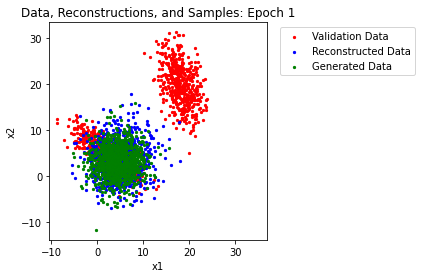

Epoch 2 Average Validation Loss: 13.4454


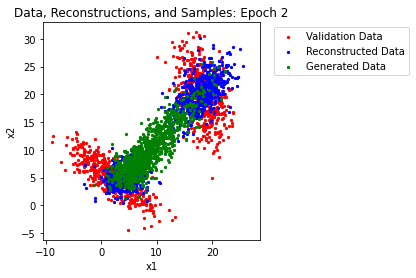

Epoch 3 Average Validation Loss: 12.1746


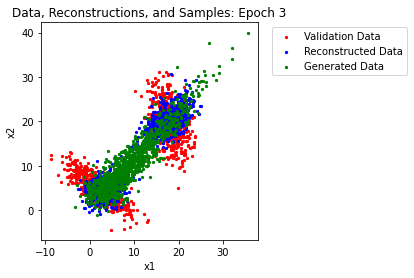

Epoch 4 Average Validation Loss: 12.0753


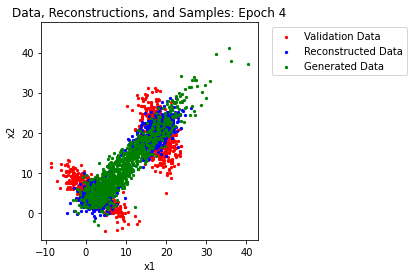

Epoch 5 Average Validation Loss: 11.9941


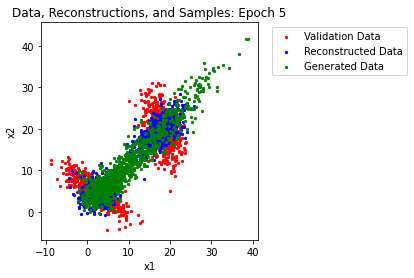

Epoch 6 Average Validation Loss: 11.9279


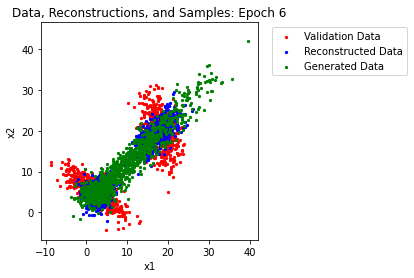

Epoch 7 Average Validation Loss: 11.8499


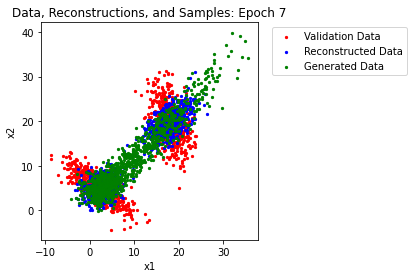

Epoch 8 Average Validation Loss: 11.8452


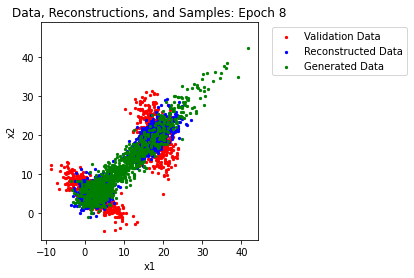

Epoch 9 Average Validation Loss: 11.6975


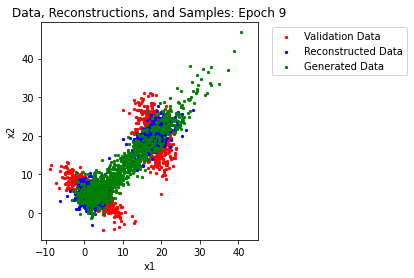

Epoch 10 Average Validation Loss: 11.5351


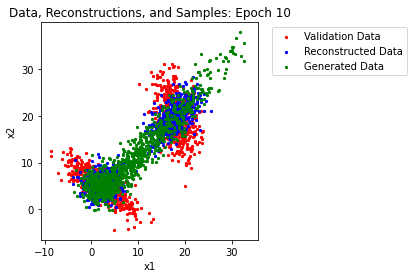

Epoch 11 Average Validation Loss: 10.7521


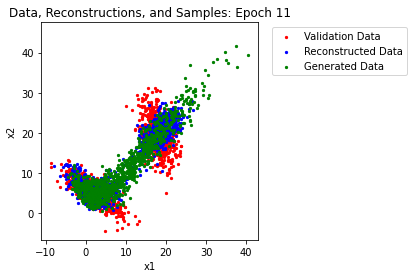

Epoch 12 Average Validation Loss: 10.1121


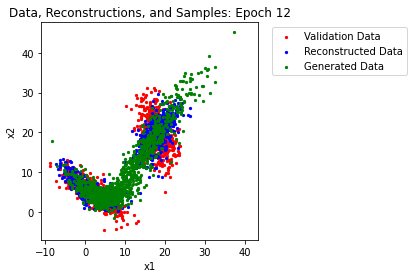

Epoch 13 Average Validation Loss: 9.7392


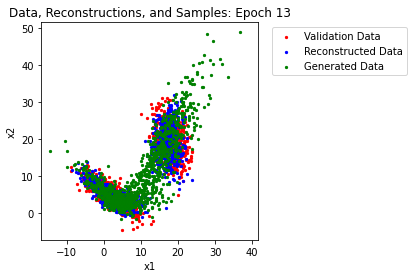

Epoch 14 Average Validation Loss: 9.4349


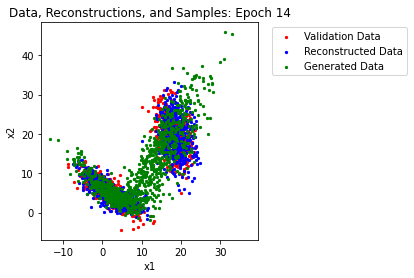

Epoch 15 Average Validation Loss: 9.3671


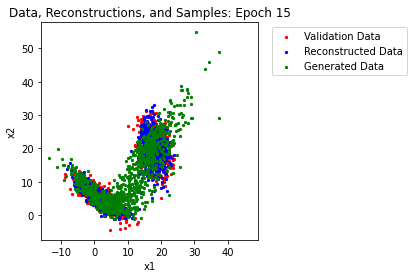

Epoch 16 Average Validation Loss: 9.2901


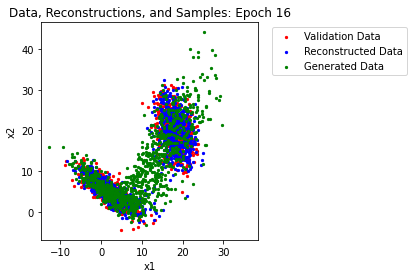

Epoch 17 Average Validation Loss: 9.2303


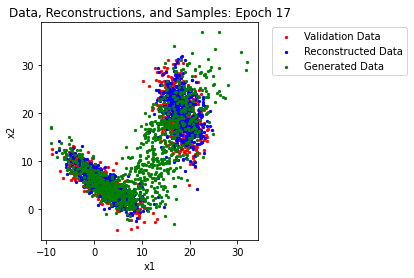

Epoch 18 Average Validation Loss: 9.3825


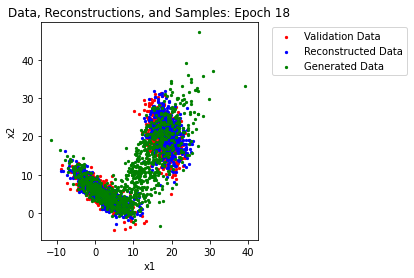

Epoch 19 Average Validation Loss: 9.1776


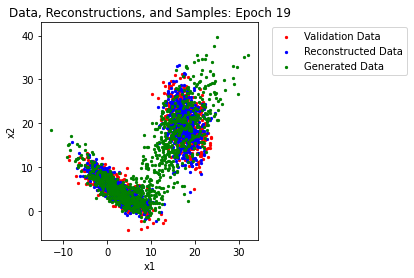

Epoch 20 Average Validation Loss: 9.2584


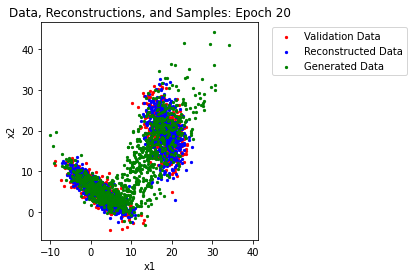

Epoch 21 Average Validation Loss: 9.0687


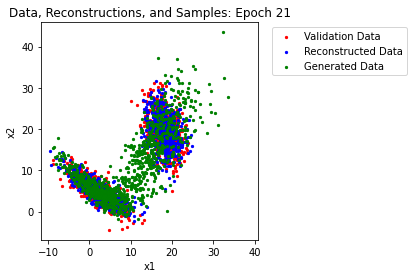

Epoch 22 Average Validation Loss: 9.0823


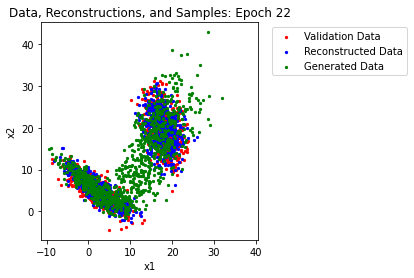

Epoch 23 Average Validation Loss: 9.0837


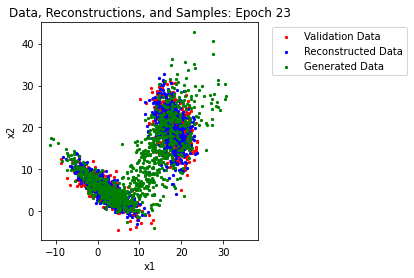

Epoch 24 Average Validation Loss: 9.0275


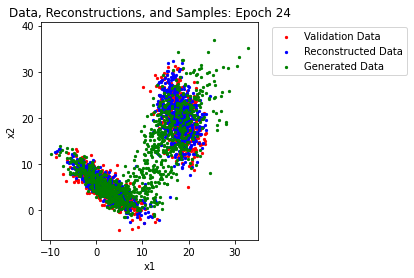

Epoch 25 Average Validation Loss: 8.9983


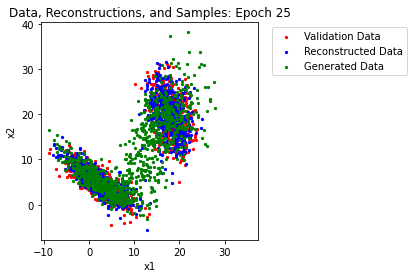

Epoch 26 Average Validation Loss: 9.0973


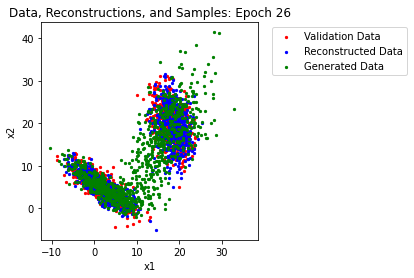

Epoch 27 Average Validation Loss: 8.9659


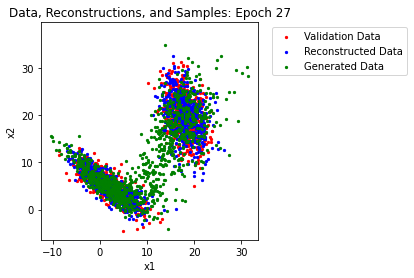

Epoch 28 Average Validation Loss: 9.0486


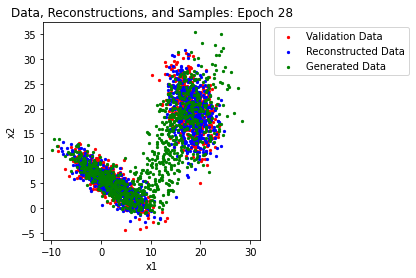

Epoch 29 Average Validation Loss: 9.0279


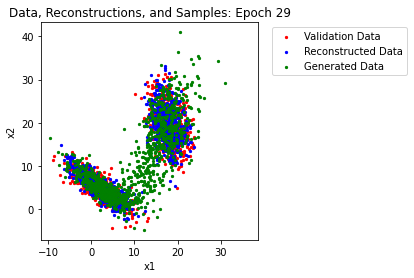

Epoch 30 Average Validation Loss: 8.9762


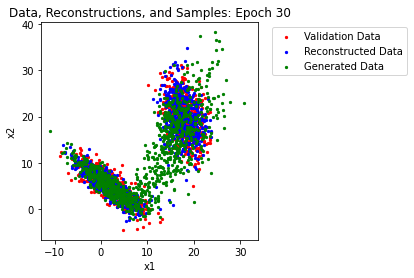

Epoch 31 Average Validation Loss: 8.9550


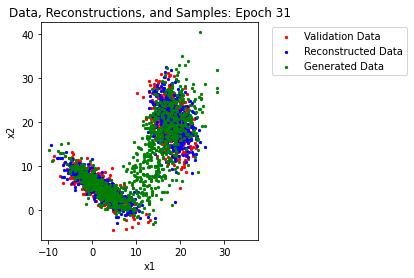

Epoch 32 Average Validation Loss: 8.9112


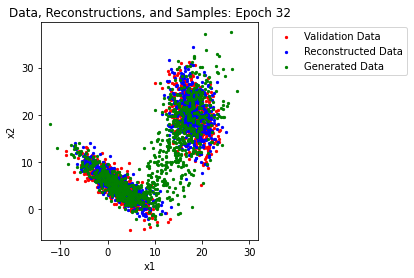

Epoch 33 Average Validation Loss: 8.9848


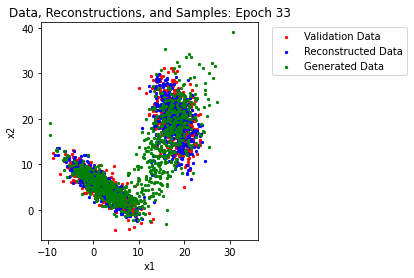

Epoch 34 Average Validation Loss: 8.9678


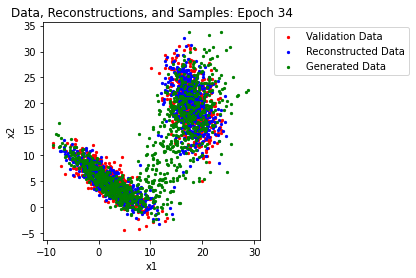

Epoch 35 Average Validation Loss: 8.9468


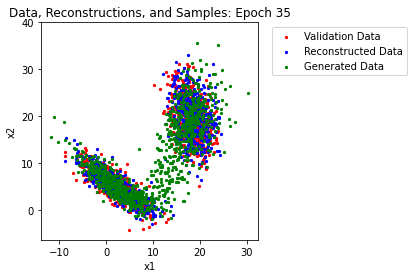

Epoch 36 Average Validation Loss: 8.9470


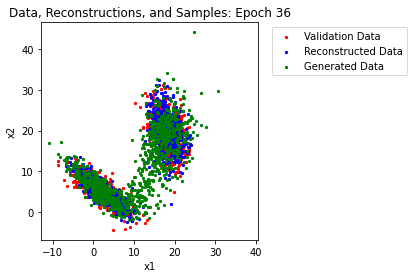

Epoch 37 Average Validation Loss: 8.8222


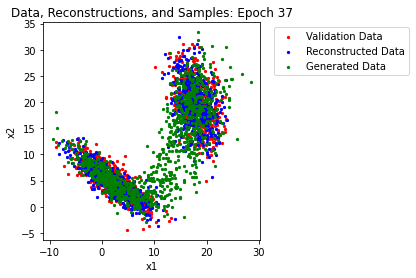

Epoch 38 Average Validation Loss: 8.9404


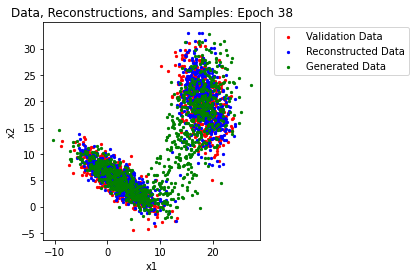

Epoch 39 Average Validation Loss: 8.8403


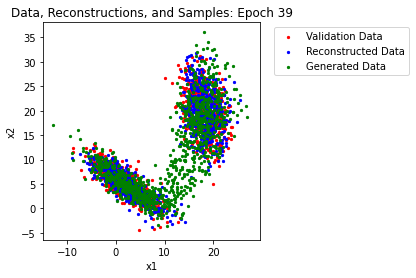

Epoch 40 Average Validation Loss: 8.7987


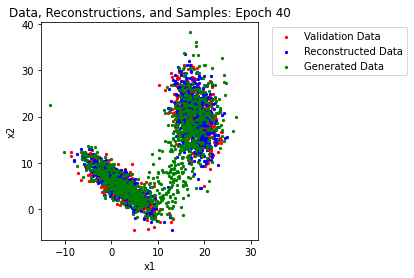

Epoch 41 Average Validation Loss: 8.8122


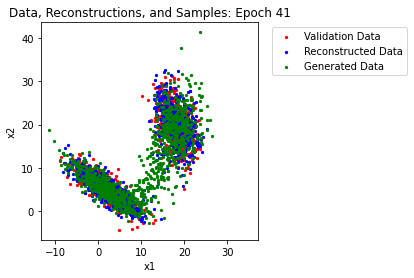

Epoch 42 Average Validation Loss: 8.8955


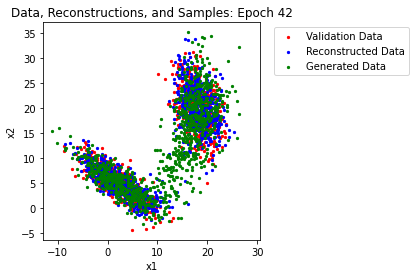

Epoch 43 Average Validation Loss: 8.7988


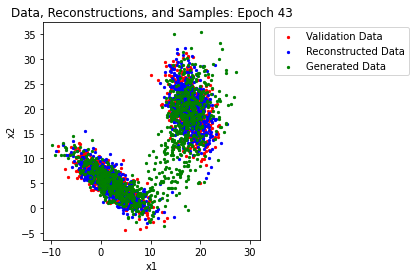

Epoch 44 Average Validation Loss: 8.8102


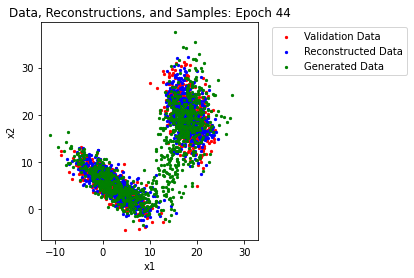

Epoch 45 Average Validation Loss: 8.7812


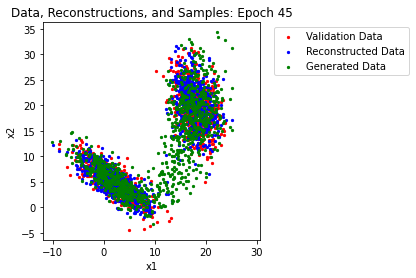

Epoch 46 Average Validation Loss: 8.7031


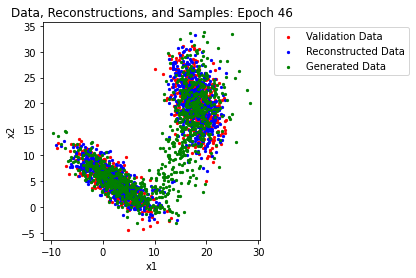

Epoch 47 Average Validation Loss: 8.6749


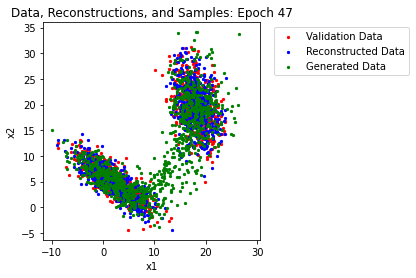

Epoch 48 Average Validation Loss: 8.8082


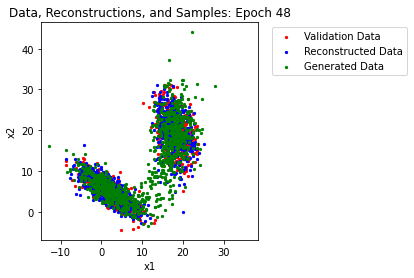

Epoch 49 Average Validation Loss: 8.7722


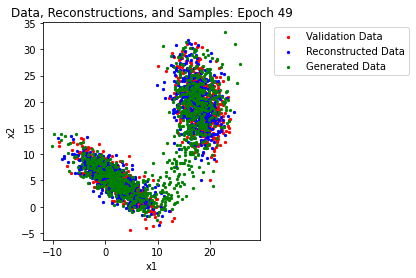

Epoch 50 Average Validation Loss: 8.7095


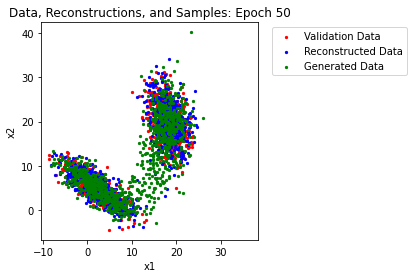

Epoch 51 Average Validation Loss: 8.7238


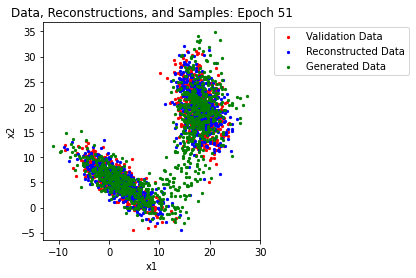

Epoch 52 Average Validation Loss: 8.6995


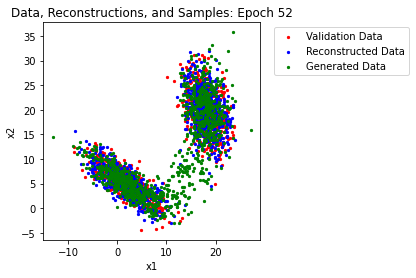

Epoch 53 Average Validation Loss: 8.6691


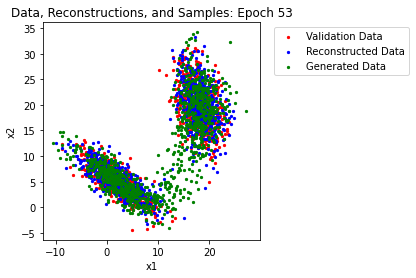

Epoch 54 Average Validation Loss: 8.6183


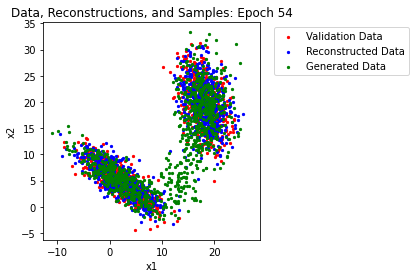

Epoch 55 Average Validation Loss: 8.7358


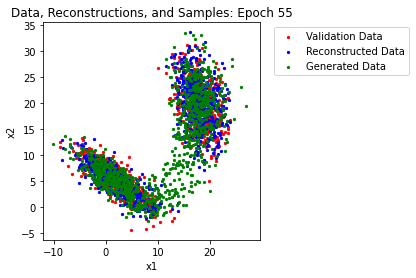

Epoch 56 Average Validation Loss: 8.7190


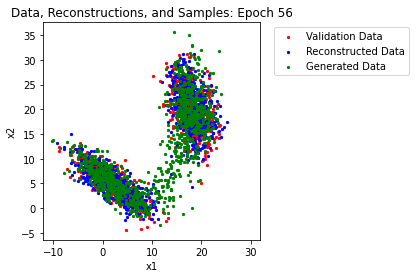

Epoch 57 Average Validation Loss: 8.6105


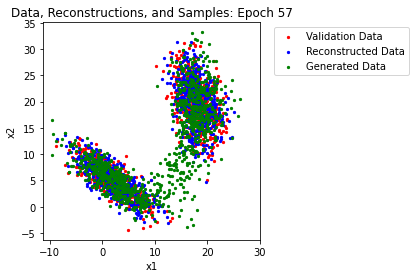

Epoch 58 Average Validation Loss: 8.5790


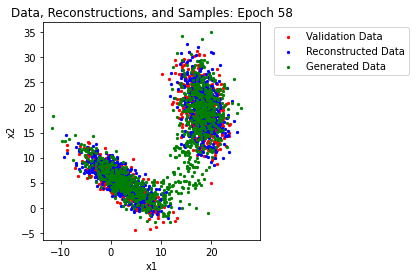

Epoch 59 Average Validation Loss: 8.6965


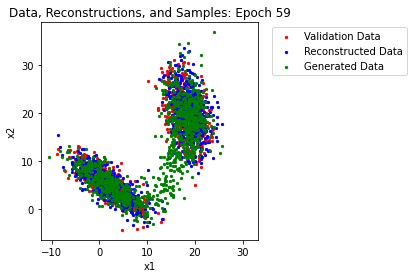

Epoch 60 Average Validation Loss: 8.7378


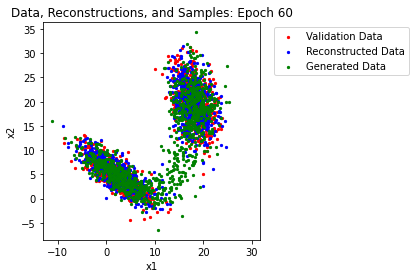

Epoch 61 Average Validation Loss: 8.6523


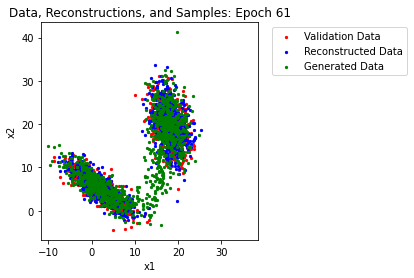

Epoch 62 Average Validation Loss: 8.8112


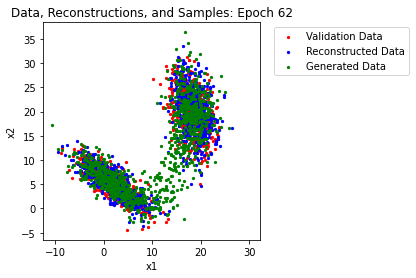

Epoch 63 Average Validation Loss: 8.6222


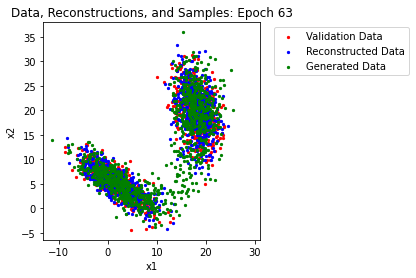

Epoch 64 Average Validation Loss: 8.6742


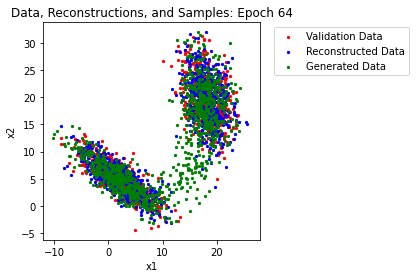

Epoch 65 Average Validation Loss: 8.6764


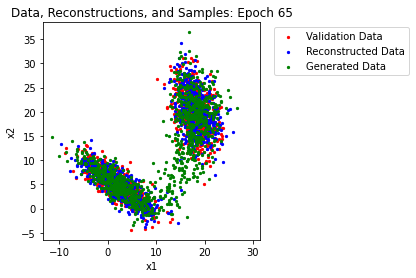

Epoch 66 Average Validation Loss: 8.7123


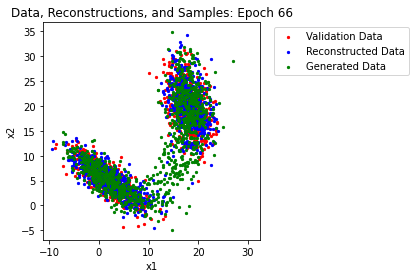

Epoch 67 Average Validation Loss: 8.6357


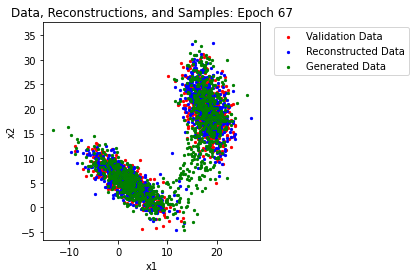

Epoch 68 Average Validation Loss: 8.7583


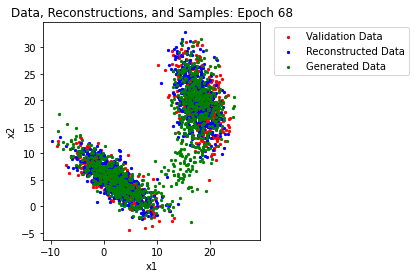

Epoch 69 Average Validation Loss: 8.6559


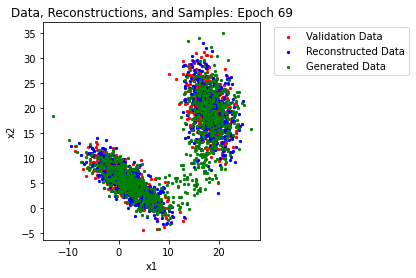

Epoch 70 Average Validation Loss: 8.7076


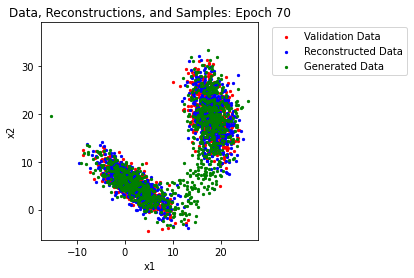

Epoch 71 Average Validation Loss: 8.5841


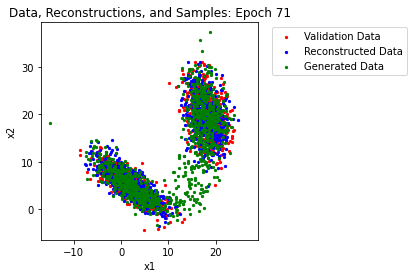

Epoch 72 Average Validation Loss: 8.6865


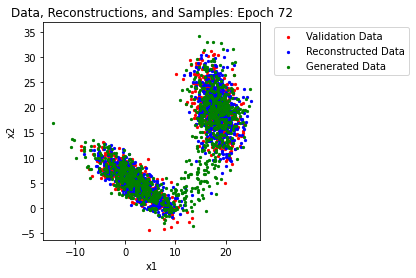

Epoch 73 Average Validation Loss: 8.6811


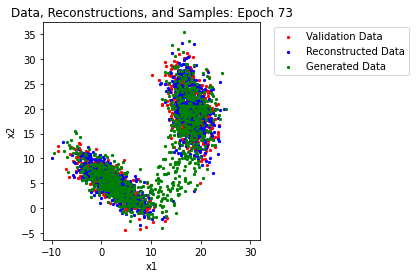

Epoch 74 Average Validation Loss: 8.7406


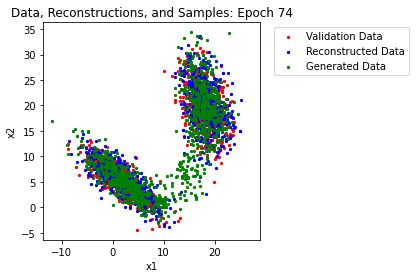

Epoch 75 Average Validation Loss: 8.6710


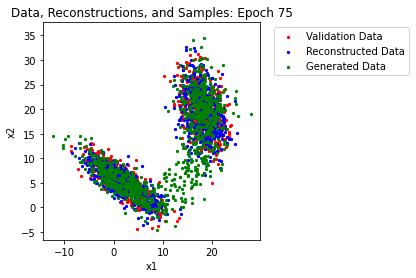

Epoch 76 Average Validation Loss: 8.6012


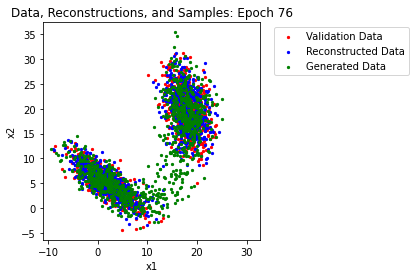

Epoch 77 Average Validation Loss: 8.6498


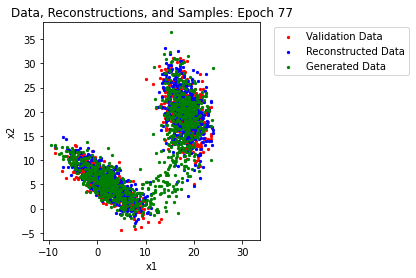

Epoch 78 Average Validation Loss: 8.5939


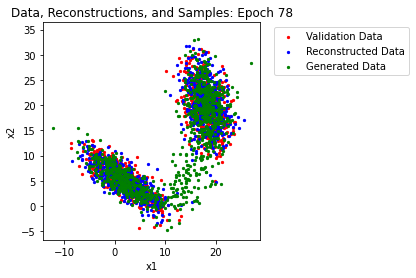

Epoch 79 Average Validation Loss: 8.5712


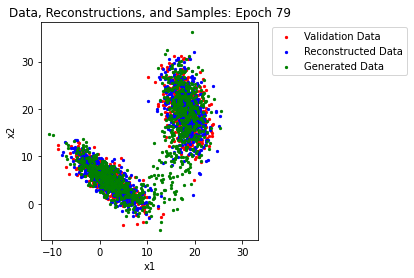

Epoch 80 Average Validation Loss: 8.6287


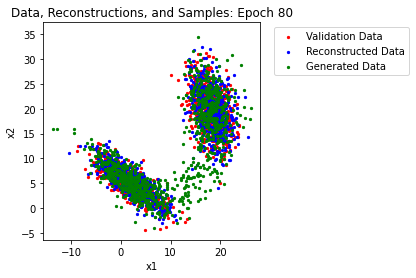

Epoch 81 Average Validation Loss: 8.6576


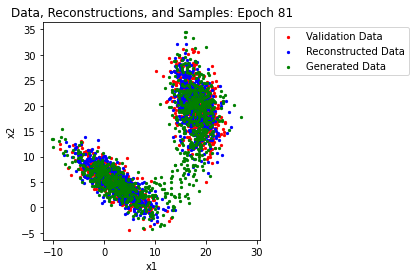

Epoch 82 Average Validation Loss: 8.5999


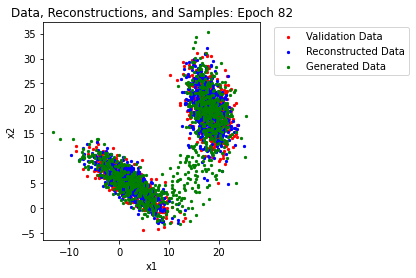

Epoch 83 Average Validation Loss: 8.6779


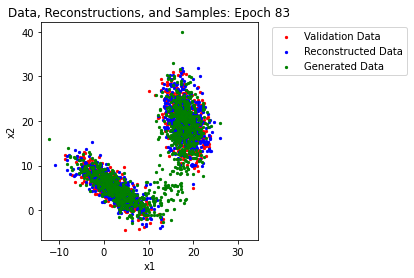

Epoch 84 Average Validation Loss: 8.5257


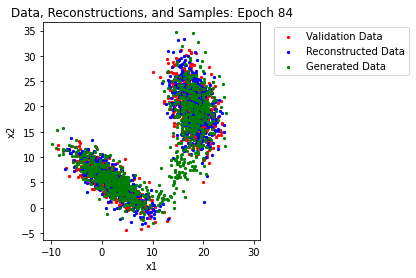

Epoch 85 Average Validation Loss: 8.5944


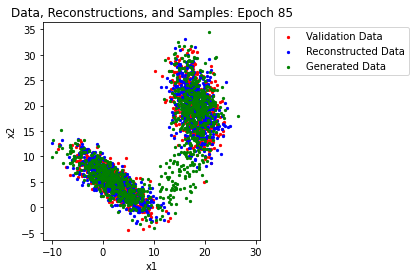

Epoch 86 Average Validation Loss: 8.6002


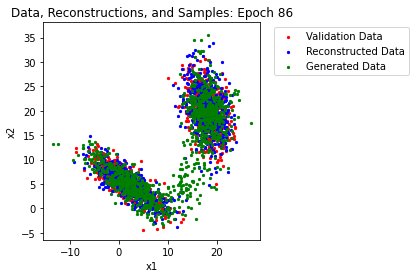

Epoch 87 Average Validation Loss: 8.6142


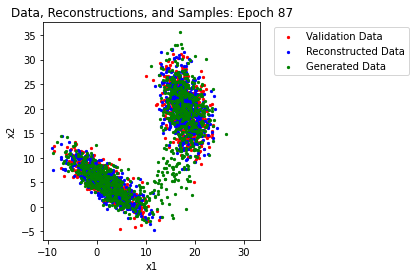

Epoch 88 Average Validation Loss: 8.6573


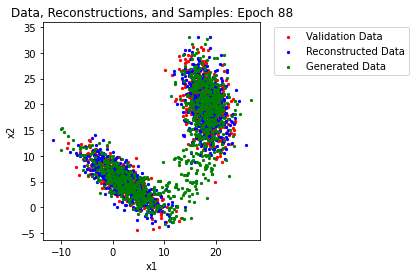

Epoch 89 Average Validation Loss: 8.5886


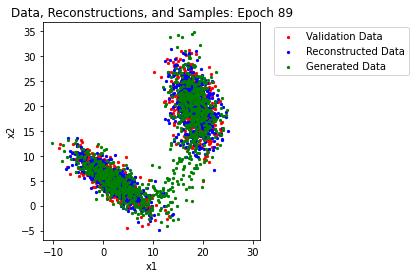

Epoch 90 Average Validation Loss: 8.7774


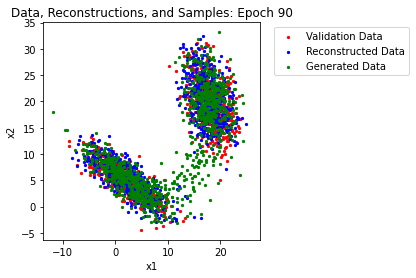

Epoch 91 Average Validation Loss: 8.6124


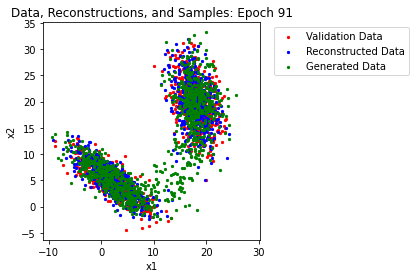

Epoch 92 Average Validation Loss: 8.6710


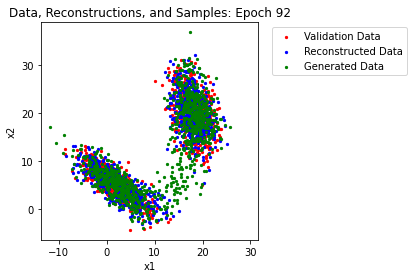

Epoch 93 Average Validation Loss: 8.5942


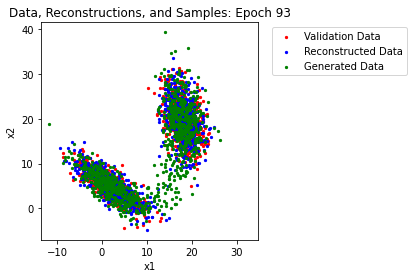

Epoch 94 Average Validation Loss: 8.6633


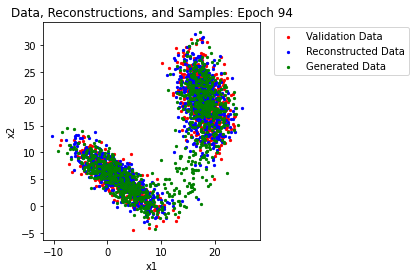

Epoch 95 Average Validation Loss: 8.6536


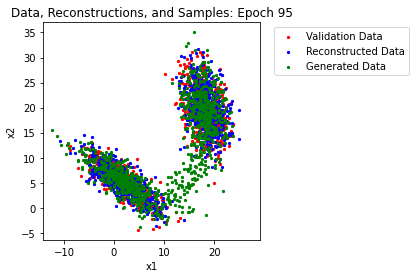

Epoch 96 Average Validation Loss: 8.6182


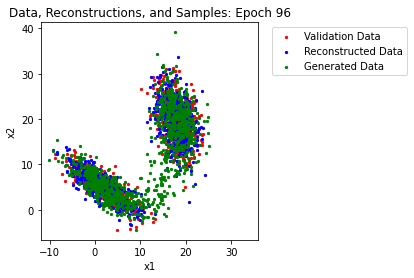

Epoch 97 Average Validation Loss: 8.6708


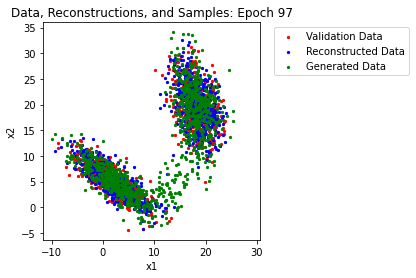

Epoch 98 Average Validation Loss: 8.6266


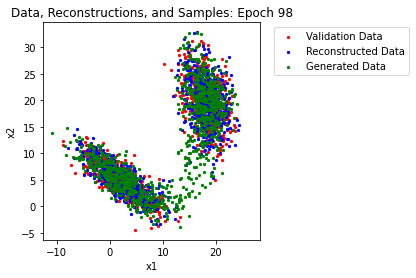

Epoch 99 Average Validation Loss: 8.6093


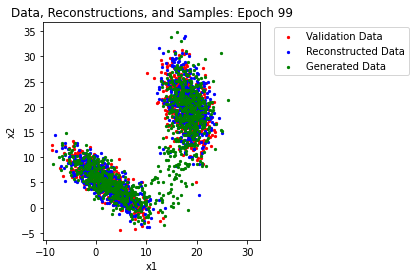

Epoch 100 Average Validation Loss: 8.6214


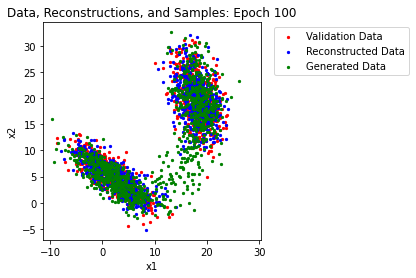

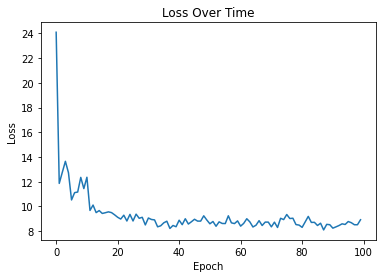

In [19]:
eval(model_list_ex2, loss_list_ex2, valid_loader_ex2, optimizer_ex2)

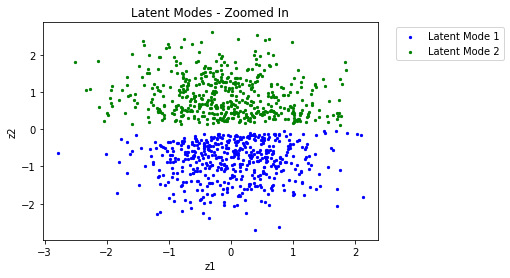

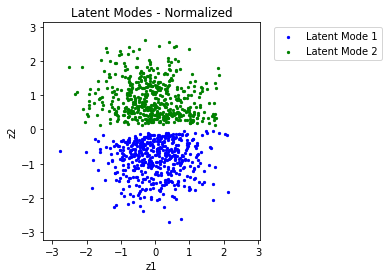

In [20]:
# visualizing the latent space of the final model
final_model_ex2 = model_list_ex2[-1]
latent_data_1 = final_model_ex2._encoder(valid_data_1)  # data from mode 1
latent_data_2 = final_model_ex2._encoder(valid_data_2)  # data from mode 2

# zoomed view
plt.scatter(latent_data_1[:, 0].detach().numpy(), latent_data_1[:, 1].detach().numpy(), c='b', s=5)
plt.scatter(latent_data_2[:, 0].detach().numpy(), latent_data_2[:, 1].detach().numpy(), c='g', s=5)
plt.title("Latent Modes - Zoomed In")
plt.xlabel('z1')
plt.ylabel('z2')
plt.legend(
    ['Latent Mode 1', 'Latent Mode 2'],
    bbox_to_anchor=(1.04,1),
    loc="upper left",
)
plt.show()

# normalized view
plt.scatter(latent_data_1[:, 0].detach().numpy(), latent_data_1[:, 1].detach().numpy(), c='b', s=5)
plt.scatter(latent_data_2[:, 0].detach().numpy(), latent_data_2[:, 1].detach().numpy(), c='g', s=5)
plt.title("Latent Modes - Normalized")
plt.xlabel('z1')
plt.ylabel('z2')
plt.legend(
    ['Latent Mode 1', 'Latent Mode 2'],
    bbox_to_anchor=(1.04,1),
    loc="upper left",
)
ax = plt.gca()
plt.axis('square')
plot_margin = 0.25
x0, x1, y0, y1 = plt.axis()
plt.axis((x0 - plot_margin,
          x1 + plot_margin,
          y0 - plot_margin,
          y1 + plot_margin))
plt.show()

## 5. Example 3: MNIST with VAE

### 5.1 Loading Data

The DOWNLOAD_FLAG flag when set to *True* will download the dataset and the necessary file structure into the directory specified by *data_dir*. Once you do this once, you can set it equal to *False* and it will look in root for the data. If you're reading this, there should be the necessary file structure already with the dataset in it. If there isn't, this lets you generate it.

In [21]:
data_dir = './datasets/'
obs_dim = 784  # MNIST contains 28 x 28 images
DOWNLOAD_FLAG = True

# shape of samples is (B, C, L, L), where B is batch, C is channels=1, L is length=28
train_data_mnist = MNIST(
    root=data_dir,
    train=True,
    transform=torchvision.transforms.ToTensor(),
    download=DOWNLOAD_FLAG,
)
valid_data_mnist = MNIST(
    root=data_dir,
    train=False,
    transform=torchvision.transforms.ToTensor(),
    download=DOWNLOAD_FLAG,
)

### 5.2 Training Settings

I've set the epochs much higher before than this, but it just takes a very long time to train. I've included a model trained over 50 epochs of data in the ckpts folder, which you can load when generating random samples.

In [22]:
# hyperparameters
latent_dim = 2
batch_size = 32
epochs = 10
lr = 1e-3  # initial learning rateminibatch
step_size = 100  # steps per decay for lr scheduler
gamma = 0.95  # multiplicative decay for lr scheduler

In [23]:
# preparing dataloaders, optimizer, and scheduler
model_ex3 = VAE2(latent_dim, obs_dim)
train_loader_ex3 = torch.utils.data.DataLoader(
    train_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex3 = torch.utils.data.DataLoader(
    valid_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex3 = optim.Adam(model_ex3.parameters(), lr=lr)
scheduler_ex3 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex3, step_size=step_size, gamma=gamma)

### 5.3 Training

If you're not tinkering with things specifically, you probably don't want to run the train() block! It takes a lot longer to train a model on data this high-dimensional compared to the extremely low-dimensional data we used before. The first block here just (optionally) selects a model to start training from, useful if you have a checkpoint of a partially trained model. The second block actually trains the model.

In [24]:
# checkpointing
ckpt_path = None  # train from scratch
# ckpt_path = "./ckpts/VAE_MNIST_LOCAL.pth"  # train from saved model

# check if ckpts dir exists
if not os.path.exists("./ckpts"):
    os.makedirs("./ckpts")

In [25]:
model_list_ex3, loss_list_ex3 = train(
    model_ex3,
    epochs,
    train_loader_ex3,
    optimizer_ex3,
    scheduler=scheduler_ex3,
    vae_type=2,
    print_iter=100,
    ckpt_path=ckpt_path,
)
torch.save(model_list_ex3[-1].state_dict(), './ckpts/VAE_MNIST_LOCAL.pth')

Epoch: 1	Iteration: 100	Loss: 193.0638
Epoch: 1	Iteration: 200	Loss: 197.0561
Epoch: 1	Iteration: 300	Loss: 195.7494
Epoch: 1	Iteration: 400	Loss: 177.2912
Epoch: 1	Iteration: 500	Loss: 174.9449
Epoch: 1	Iteration: 600	Loss: 184.0679
Epoch: 1	Iteration: 700	Loss: 158.2596
Epoch: 1	Iteration: 800	Loss: 177.4968
Epoch: 1	Iteration: 900	Loss: 186.5103
Epoch: 1	Iteration: 1000	Loss: 166.4542
Epoch: 1	Iteration: 1100	Loss: 163.5337
Epoch: 1	Iteration: 1200	Loss: 159.8217
Epoch: 1	Iteration: 1300	Loss: 157.9114
Epoch: 1	Iteration: 1400	Loss: 176.7746
Epoch: 1	Iteration: 1500	Loss: 168.8799
Epoch: 1	Iteration: 1600	Loss: 163.2386
Epoch: 1	Iteration: 1700	Loss: 172.5024
Epoch: 1	Iteration: 1800	Loss: 167.7145
Epoch: 2	Iteration: 1900	Loss: 153.8085
Epoch: 2	Iteration: 2000	Loss: 157.1331
Epoch: 2	Iteration: 2100	Loss: 162.1797
Epoch: 2	Iteration: 2200	Loss: 146.2226
Epoch: 2	Iteration: 2300	Loss: 144.2084
Epoch: 2	Iteration: 2400	Loss: 161.2070
Epoch: 2	Iteration: 2500	Loss: 155.5570
Epoch: 2	

### 5.4 Evaluation

Since the data are 784-dimensional, we can't just plot them to visualize the distribution. However, we can just draw samples from the model at each stage in training to see if it outputs samples that looks reasonably like images of digits. 

Run the first block to reconstruct the first sample from the validation set at each epoch and also to generate a random sample. You can only run this right after the train() function is called or you won't have the model lists. However, you can still use the generation code below to write something to test reconstruction on the cached model.

Run the second block to sample a random image from the final model. You can run this as many times as you want to generate samples. Observe that every time you run it, a different number will appear. This is because you can't control the conditioning of the sample. Again, CVAEs address this problem.

Run the third block to visualize the latent manifold (both with sampled images and with the validation set). To generate the first plot, we sweep through latent values from -5 to 5 on each axis and then pass that through the decoder to see what is generated. Recall that for our specific model, this mapping is deterministic. For the second plot, we simply encode the validation set and sample from the resulting distribution. Notice how you can tell where in space the numbers are encoded by comparing the two plots! Code adapted from: https://github.com/ykwon0407/variational_autoencoder/blob/master/variational_bayes.ipynb

By changing our architecture or tuning hyperparameters, we could probably recover a cleaner latent manifold. But, it's quite interesting how good the results look after only a couple of minutes of training!

Epoch 1 Average Validation Loss: 163.3343
Epoch 2 Average Validation Loss: 155.6060
Epoch 3 Average Validation Loss: 152.3988
Epoch 4 Average Validation Loss: 149.5530
Epoch 5 Average Validation Loss: 147.3820
Epoch 6 Average Validation Loss: 146.6509
Epoch 7 Average Validation Loss: 145.9838
Epoch 8 Average Validation Loss: 145.3074
Epoch 9 Average Validation Loss: 144.4148
Epoch 10 Average Validation Loss: 144.1897


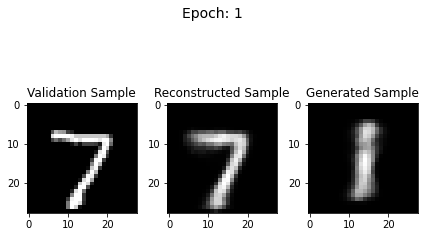

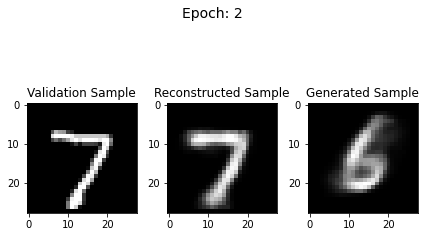

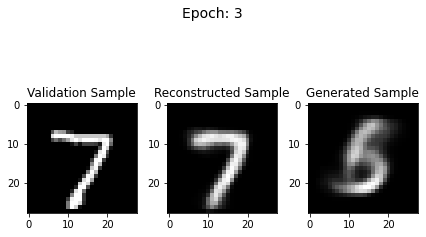

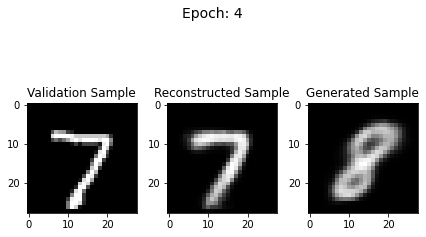

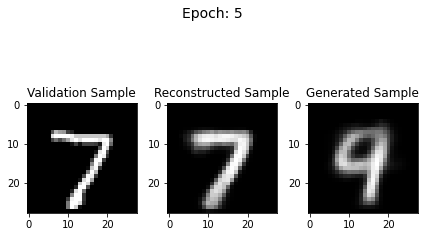

...

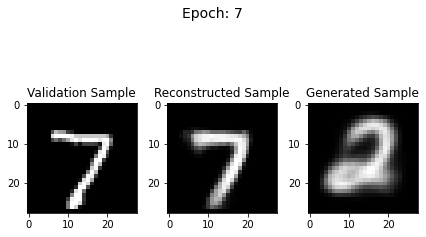

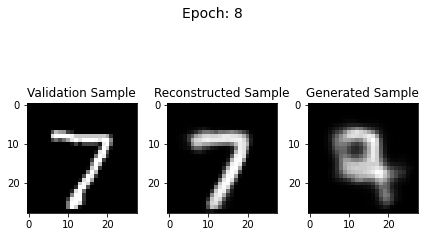

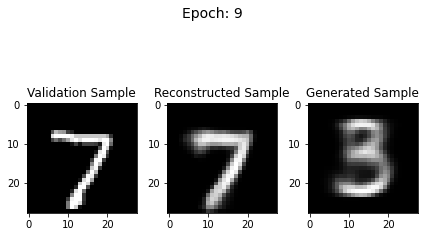

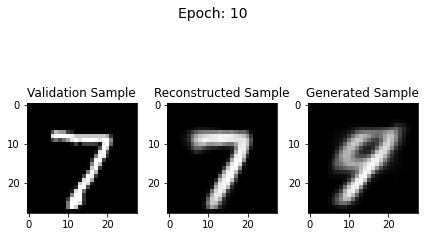

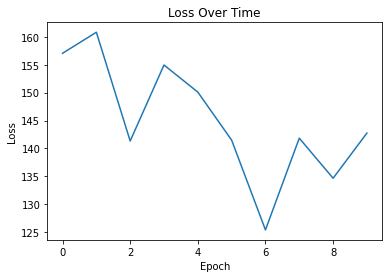

In [26]:
eval(model_list_ex3, loss_list_ex3, valid_loader_ex3, optimizer_ex3, vae_type=2)

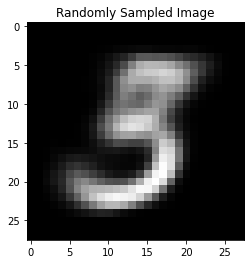

In [27]:
# generate random samples of handwritten numbers
# run this block over and over to get different samples!
final_model_ex3 = VAE2(2, 784)
final_model_ex3.load_state_dict(torch.load('./ckpts/VAE_MNIST_LOCAL.pth'))  # provided model
img_sample = final_model_ex3.generate(1)
plt.imshow(img_sample.detach(), cmap='gray')
plt.title('Randomly Sampled Image')
plt.show()

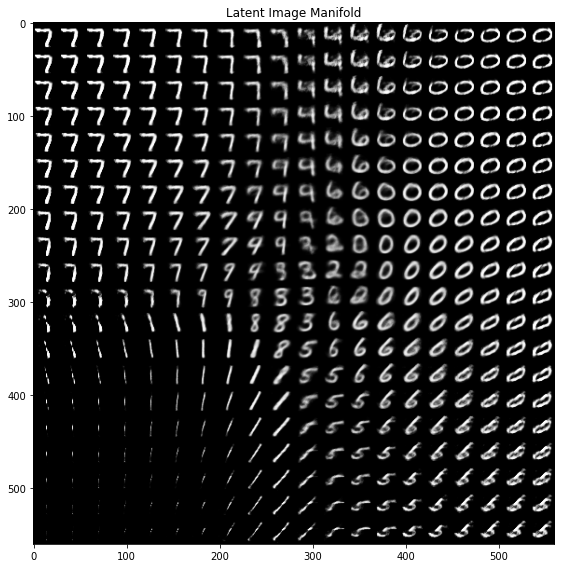

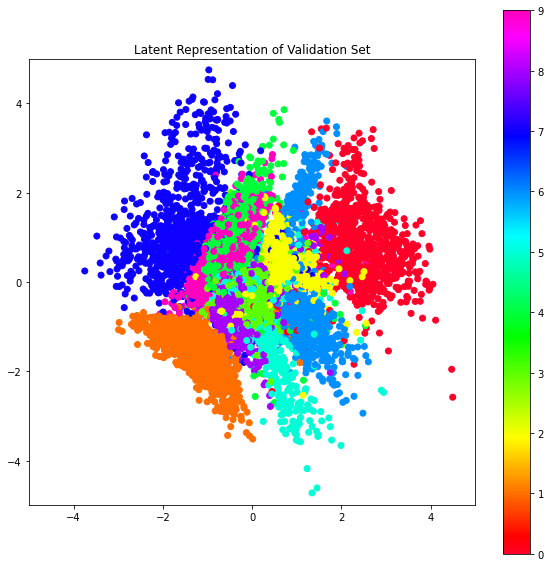

In [28]:
# loading model
final_model_ex3 = VAE2(2, 784)
final_model_ex3.load_state_dict(torch.load('./ckpts/VAE_MNIST_LOCAL.pth'))  # provided model

# ############## #
# IMAGE MANIFOLD #
# ############## #

# initializing latent manifold
num_points = 20
z1_vals = np.linspace(-5, 5, num_points)
z2_vals = np.linspace(-5, 5, num_points)
manifold = np.empty((28 * num_points, 28 * num_points))

# looping through latent values to fill manifold
for i, z2i in enumerate(z1_vals):
    for j, z1j in enumerate(z2_vals):
        z = torch.Tensor([z1j, z2i])
        x_gen_flat = final_model_ex3._decoder(z)
        x_gen = x_gen_flat.reshape(28, 28)
        manifold[
            ((num_points - i - 1) * 28) : ((num_points - i) * 28),
            (j * 28):((j + 1) * 28)
        ] = x_gen.detach()

# plotting image manifold
plt.figure(figsize=(8, 8))
plt.imshow(manifold, cmap='gray', origin='upper')
plt.title('Latent Image Manifold')
plt.tight_layout()

# ########### #
# LATENT PLOT #
# ########### #

# decoding validation dataset
x_valid = valid_data_mnist.data / 255.0
out_e = final_model_ex3._encoder(x_valid.reshape(-1, 784))
mu_e = out_e[..., :latent_dim]
var_e = out_e[..., latent_dim:]
z = final_model_ex3.reparameterize(mu_e, var_e)
targets = valid_data_mnist.targets.numpy()

# plotting latent space
plt.figure(figsize=(10, 10))
cm = plt.cm.get_cmap('gist_rainbow')
plt.scatter(mu_e[..., 0].detach(), mu_e[..., 1].detach(), c=targets, cmap=cm)
plt.title('Latent Representation of Validation Set')
plt.axis('square')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.colorbar()

## 6. Example 4: MNIST with CVAE

In this last example, we will explore how we can use conditional information to improve sampling and inference. The conditional variable we will use is the label, and we will use this to predict the image. We will see this gives us greater control over what we sample from the generative model. An implementation note: since the labels aren't continuous-valued variables, we would like to encode them as *one-hot vectors*, which represent the categorical value of an *n*-valued integer. For example, we encode each digit from 0 to 9 as a different vector whose components are all 0.0 except for the index corresponding to the digit, which is 1.0.

I provide a model trained for 10 epochs. You can obviously train for longer than this.

The data should be loaded from the cell in section 5.1.

### 6.1 Training Settings

In [29]:
# hyperparameters
latent_dim = 2
input_dim = 10
batch_size = 32
epochs = 10  # again, this could be higher
lr = 1e-3  # initial learning rate
step_size = 100  # steps per decay for lr scheduler
gamma = 0.95  # multiplicative decay for lr scheduler

In [30]:
# preparing dataloaders, optimizer, and scheduler
model_ex4 = CVAE(latent_dim, obs_dim, input_dim)
train_loader_ex4 = torch.utils.data.DataLoader(
    train_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
valid_loader_ex4 = torch.utils.data.DataLoader(
    valid_data_mnist,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)
optimizer_ex4 = optim.Adam(model_ex4.parameters(), lr=lr)

# optional lr scheduler
scheduler_ex4 = optim.lr_scheduler.StepLR(optimizer=optimizer_ex4, step_size=step_size, gamma=gamma)
# scheduler_ex4 = None

### 6.2 Training

In [31]:
# checkpointing
ckpt_path = None  # train from scratch
# ckpt_path = "./ckpts/CVAE_MNIST_LOCAL.pth"  # train from saved model

# check if ckpts dir exists
if not os.path.exists("./ckpts"):
    os.makedirs("./ckpts")

In [32]:
model_list_ex4, loss_list_ex4 = train(
    model_ex4,
    epochs,
    train_loader_ex4,
    optimizer_ex4,
    scheduler=scheduler_ex4,
    vae_type=3,
    print_iter=100,
    ckpt_path=ckpt_path,
)
torch.save(model_list_ex4[-1].state_dict(), './ckpts/CVAE_MNIST_LOCAL.pth')

Epoch: 1	Iteration: 100	Loss: 203.5457
Epoch: 1	Iteration: 200	Loss: 188.9414
Epoch: 1	Iteration: 300	Loss: 165.4809
Epoch: 1	Iteration: 400	Loss: 169.2074
Epoch: 1	Iteration: 500	Loss: 159.7606
Epoch: 1	Iteration: 600	Loss: 154.5585
Epoch: 1	Iteration: 700	Loss: 150.4922
Epoch: 1	Iteration: 800	Loss: 139.5203
Epoch: 1	Iteration: 900	Loss: 150.7472
Epoch: 1	Iteration: 1000	Loss: 153.9428
Epoch: 1	Iteration: 1100	Loss: 135.2623
Epoch: 1	Iteration: 1200	Loss: 153.2501
Epoch: 1	Iteration: 1300	Loss: 140.9172
Epoch: 1	Iteration: 1400	Loss: 147.2274
Epoch: 1	Iteration: 1500	Loss: 144.4789
Epoch: 1	Iteration: 1600	Loss: 149.0484
Epoch: 1	Iteration: 1700	Loss: 157.2604
Epoch: 1	Iteration: 1800	Loss: 133.8047
Epoch: 2	Iteration: 1900	Loss: 133.6546
Epoch: 2	Iteration: 2000	Loss: 133.5424
Epoch: 2	Iteration: 2100	Loss: 124.3992
Epoch: 2	Iteration: 2200	Loss: 132.9526
Epoch: 2	Iteration: 2300	Loss: 133.3563
Epoch: 2	Iteration: 2400	Loss: 137.9858
Epoch: 2	Iteration: 2500	Loss: 132.6526
Epoch: 2	

### 6.3 Evaluation

We can look at the same evaluations as before. Note that when generating samples, we now have to provide the conditioning variable (the label corresponding to the number we want to generate).

In the second block, we can now choose one of each digit to generate! It sometimes doesn't get it exactly right, but for the most part, it does pretty well. We can train the model for longer to get better performance.

The latent manifold visualization is a bit different. Now, our latent image manifolds must be conditioned on the labels, so there isn't a nice way to visualize an unconditional latent space. However, we CAN visualize the latent manifolds for each digit. The latent space no longer encodes information about what digit the data is represented by, but instead other qualitative features like how slanted the number is written. The provided label encapsulates a large portion of the statistical information in each image. In the third cell, we plot the manifolds for digits from 0 to 9. In the second plot, we overlay all the conditional latent samples from each digit in the validation set. Notice how the distributions all overlap now! This is because the types of features encode in the latent space are now shared across each digit. In other words, the digit "7" and "9" can both be slanted the same way, for example, so they can both map to the same point in latent space. The distinction between "7"-ness or "9"-ness is expressed by the label.

Epoch 1 Average Validation Loss: 139.4539
Epoch 2 Average Validation Loss: 134.9002
Epoch 3 Average Validation Loss: 133.4131
Epoch 4 Average Validation Loss: 132.6343
Epoch 5 Average Validation Loss: 131.8659
Epoch 6 Average Validation Loss: 131.1225
Epoch 7 Average Validation Loss: 130.8200
Epoch 8 Average Validation Loss: 130.5599
Epoch 9 Average Validation Loss: 130.0372
Epoch 10 Average Validation Loss: 129.8836


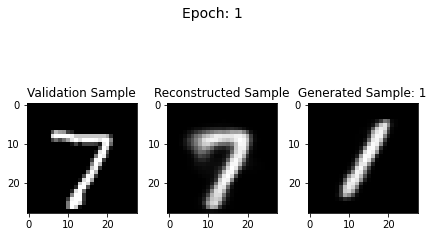

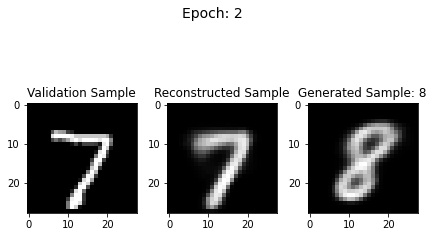

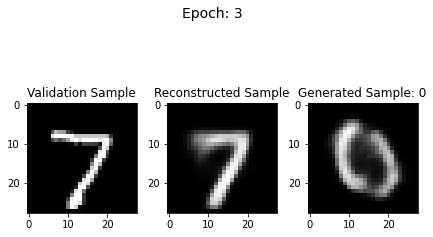

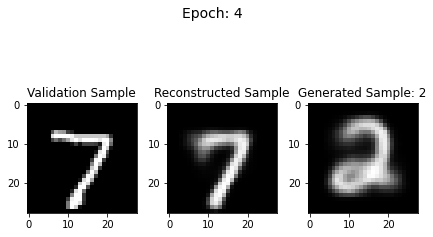

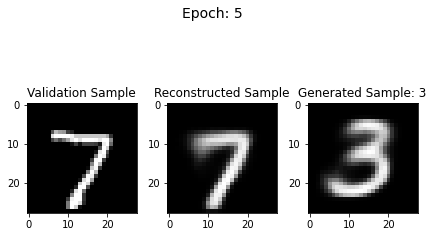

...

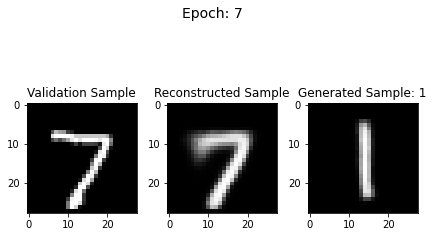

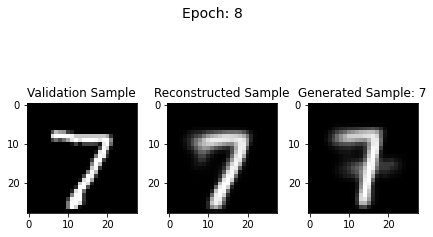

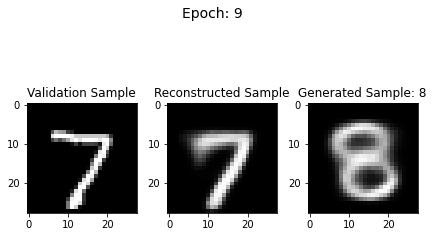

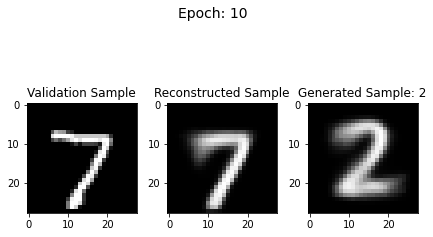

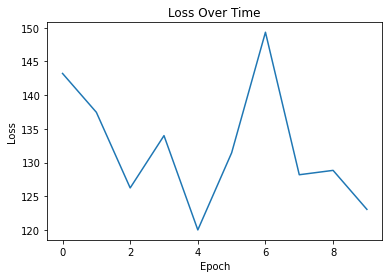

In [33]:
eval(model_list_ex4, loss_list_ex4, valid_loader_ex4, optimizer_ex4, vae_type=3)

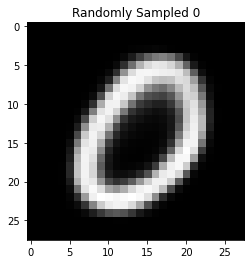

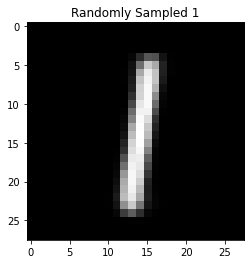

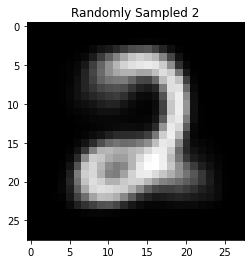

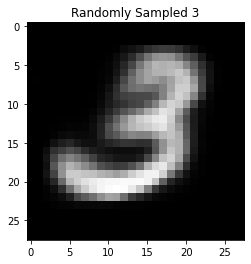

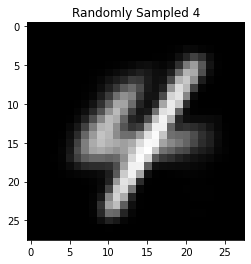

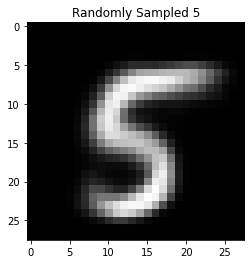

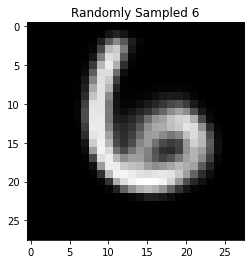

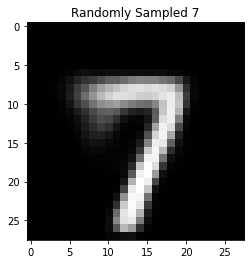

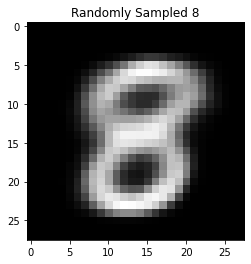

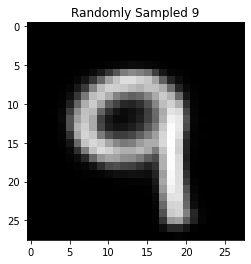

In [34]:
# generate random samples of handwritten numbers
final_model_ex4 = CVAE(2, 784, 10)
final_model_ex4.load_state_dict(torch.load('./ckpts/CVAE_MNIST_LOCAL.pth'))  # provided model

for i in range(10):
    digit = one_hot_mnist(torch.LongTensor([i]).unsqueeze(-1))
    img_sample = final_model_ex4.generate(1, digit)
    plt.imshow(img_sample.detach(), cmap='gray')
    plt.title(f'Randomly Sampled {i}')
    plt.show()

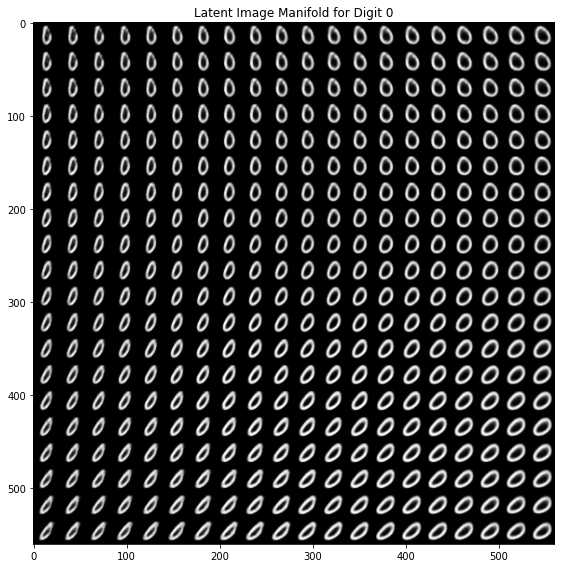

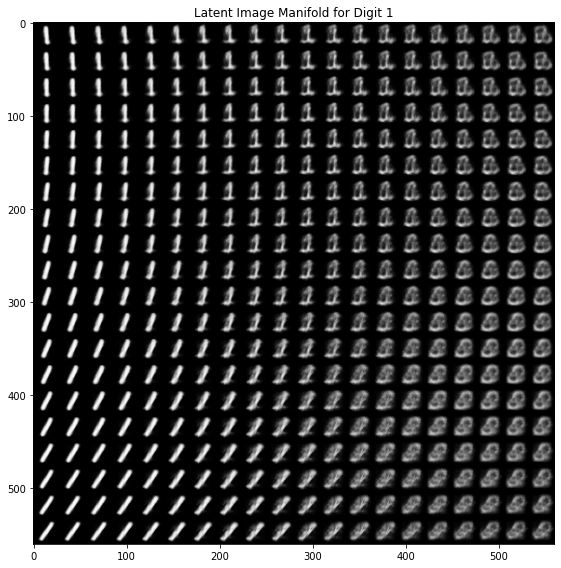

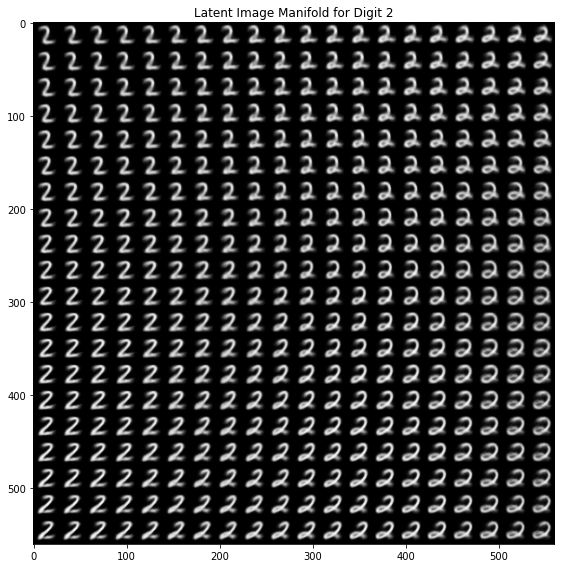

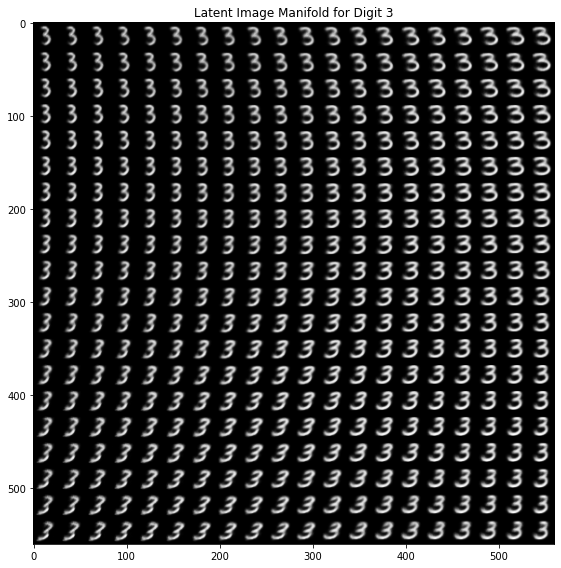

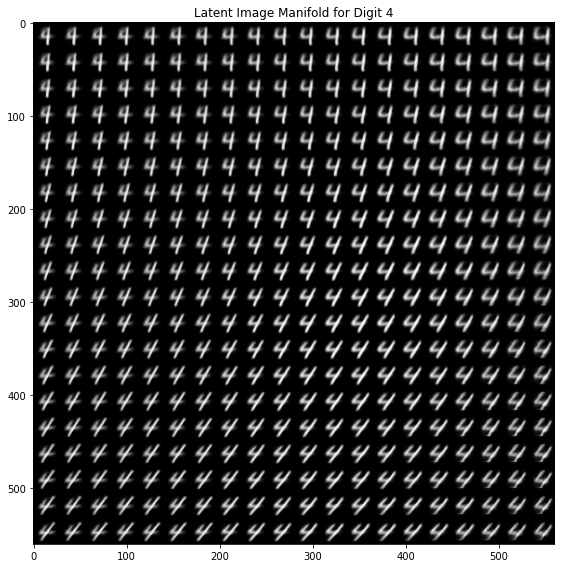

...

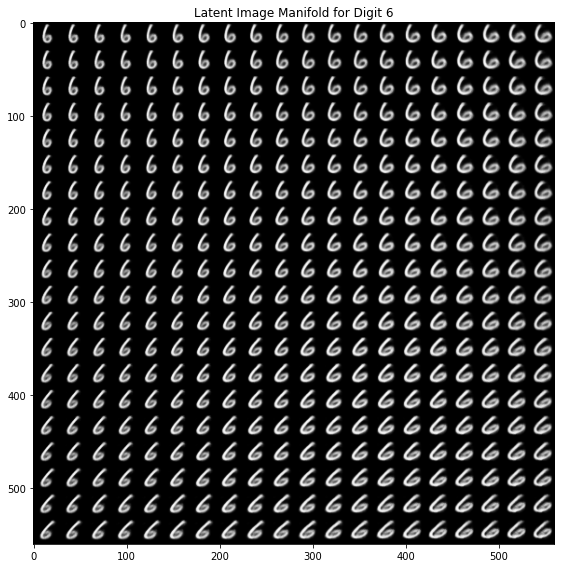

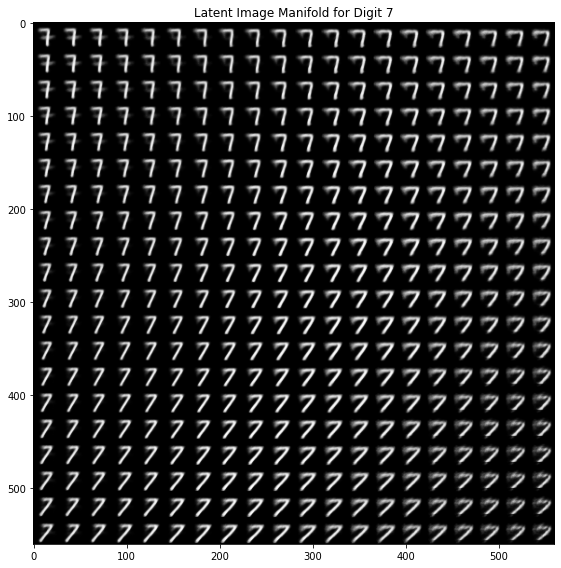

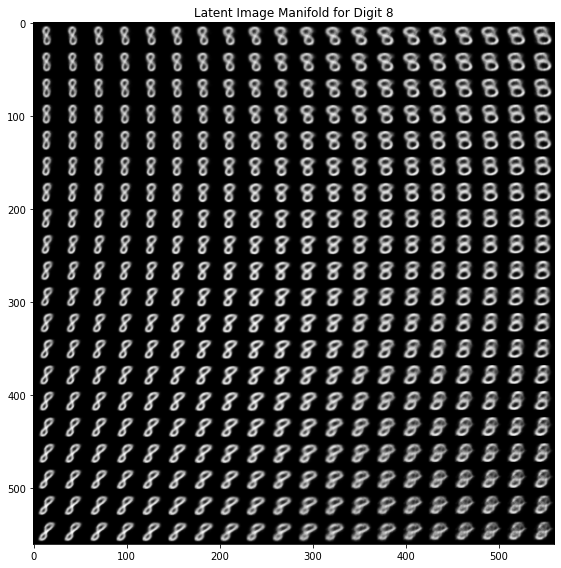

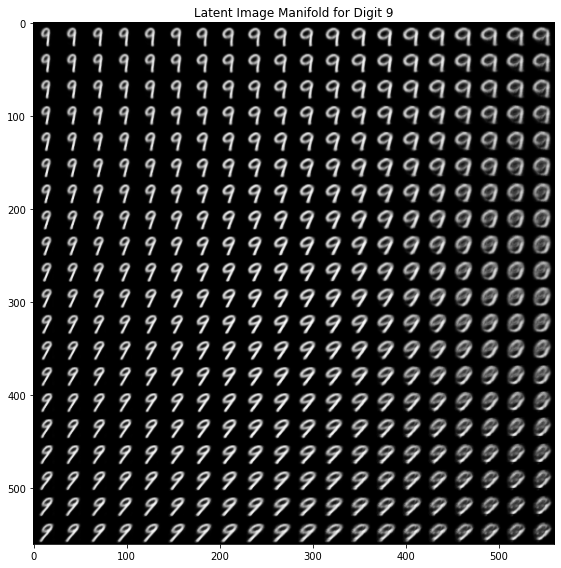

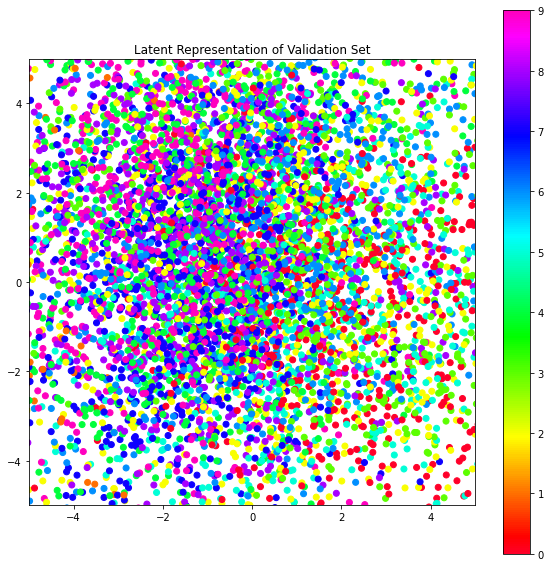

In [35]:
# loading model
final_model_ex4 = CVAE(2, 784, 10)
final_model_ex4.load_state_dict(torch.load('./ckpts/CVAE_MNIST_LOCAL.pth'))  # provided model
    
# latent image manifolds for each digit
for digit in range(10):
    label = torch.LongTensor([digit]).unsqueeze(-1)
    label = one_hot_mnist(label)

    # ############## #
    # IMAGE MANIFOLD #
    # ############## #

    # initializing latent manifold
    num_points = 20
    z1_vals = np.linspace(-5, 5, num_points)
    z2_vals = np.linspace(-5, 5, num_points)
    manifold = np.empty((28 * num_points, 28 * num_points))

    # looping through latent values to fill manifold
    for i, z2i in enumerate(z1_vals):
        for j, z1j in enumerate(z2_vals):
            z = torch.Tensor([z1j, z2i]).unsqueeze(0)
            x_gen_flat = final_model_ex4._decoder(torch.cat([z, label], dim=-1))
            x_gen = x_gen_flat.reshape(28, 28)
            manifold[
                ((num_points - i - 1) * 28) : ((num_points - i) * 28),
                (j * 28):((j + 1) * 28)
            ] = x_gen.detach()

    # plotting image manifold
    plt.figure(figsize=(8, 8))
    plt.imshow(manifold, cmap='gray', origin='upper')
    plt.title(f'Latent Image Manifold for Digit {digit}')
    plt.tight_layout()

# ########### #
# LATENT PLOT #
# ########### #

# decoding validation dataset
x_valid = valid_data_mnist.data / 255.0
c_valid = valid_data_mnist.targets.unsqueeze(-1)
c_valid = one_hot_mnist(c_valid)
out_e = final_model_ex4._encoder(
    torch.cat([x_valid.reshape(-1, 784),
               c_valid],
              dim=-1,
    )
)
mu_e = out_e[..., :latent_dim]
var_e = out_e[..., latent_dim:]
z = final_model_ex4.reparameterize(mu_e, var_e)
targets = valid_data_mnist.targets.numpy()

# plotting latent space
plt.figure(figsize=(10, 10))
cm = plt.cm.get_cmap('gist_rainbow')
plt.scatter(mu_e[..., 0].detach(), mu_e[..., 1].detach(), c=targets, cmap=cm)
plt.title('Latent Representation of Validation Set')
plt.axis('square')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.colorbar()